# Explainer notebook for Harry Potter network and text analysis project


Before going into any details, the modules for this project are imported:

In [215]:
import networkx as nx
import nltk
from nltk import word_tokenize
from nltk import pos_tag
from nltk.corpus import stopwords, words, wordnet
from nltk.probability import FreqDist
nltk.download('words', quiet=True)
nltk.download('averaged_perceptron_tagger', quiet=True)
nltk.download('punkt', quiet=True)
nltk.download('wordnet', quiet=True)
nltk.download('stopwords', quiet=True)
import json
import urllib.request
import re
import numpy as np
import colorsys
import pandas as pd
import random
import powerlaw
import matplotlib.pyplot as plt
from fa2 import ForceAtlas2
from community import community_louvain
import seaborn as sns
from bs4 import BeautifulSoup as bsoup
from wordcloud import WordCloud, STOPWORDS
import seaborn as sns
import ssl
ssl._create_default_https_context = ssl._create_unverified_context
sns.set()
%matplotlib inline

## Motivation

#### Introduction
The following notebook presents the ideas, thoughts and implementations of core aspects of a project about network and text analysis. 
For this project the main focus is the Wizarding World of Harry Potter universe and more precisely the houses at Hogwarts.
The general idea is to create a large network of all characters at Hogwarts where their respective house is used as an attribute. 
For this project the four ordinary Hogwarts houses are considered:
* Gryffindor
* Slytherin
* Hufflepuff
* Ravenclaw

However, some characters based on the dataset - as it will be described later on - do not have a specified house and are thus placed in the "Unknown house".

First and foremost, the network analysis will be done with focus on character houses. Based on the inital network that gives a general idea of the structure and interaction of characters at Hogwarts,
it is examined how connected characters are between houses at Hogwarts. Furthermore, a community detection algorithm is used on the network to see if the found communities reflects the house seperations.
In addition, traits are described in the universe for each house. 
Therefore through text analysis, it is examined if sentiment is different from house to house and if the house traits can be detected.

To expand upon these ideas, the transcriptions of the books and movies will be included for further text analysis. 
Through the use of the books, it is examined how house representation is changed. 
For good measure - and to add more information for Harry Potter interested viewers - text analysis is also done in a more generel manner. 
A test of sentiment change is made to show a simplified version of the events during each book.
Words that can describe each book are also looked at and compared with corresponding movie versions. 
Finally, the usage of spells and their change throughout the books and movies are examined.

As Harry Potter fans ourselves, the goal of this project is to learn more about and appreciate the advanced structures 
of such a large universe like the Wizarding World of Harry Potter.




#### Dataset
The initial dataset consists of all characters at Hogwarts based on the [Harry Potter Fandom Wiki](https://harrypotter.fandom.com/wiki/Main_Page). 
There are _normal_ Wikipedia pages about the Harry Potter universe. 
However, a fandom wiki page generally includes more information about the given subject since it is maintained by hardcore fans.
Therefore, to achieve as much information about the characters at Hogwarts, the usage of the Fandom wiki was chosen over the normal Wikipedia.
The data is already divided into the five houses and their associated characters, which is then queried through API-calls. The total size of this dataset is 11 MB.

It would take forever to transcribe or scrape the texts from both the books and movies. Luckily, the internet exists and some have done most of the hard work.
[Erika Jacobs] has made a convient GitHub repository that includes text extractions from each book that can be easily downloaded through code totalling in a size of 6.4 Mb. 
For the film data, transcripts found at [Hogwarts is here](https://www.hogwartsishere.com/library/book/12647/) are used. 
By searching the internet, this webpage seemed to be the one that had most data included in the movie transcripts.
However, these transcriptions are not available for easy download and web scraping was necessary to collect this data of a size of 483 KB.

Descriptions on how the above-mentioned data is actually collected will be described later on.

#### Initial video pitch of the project
For the interested, the following [video](https://www.youtube.com/watch?v=T7DQYH0TEzk&feature=youtu.be) shows the initial pitch and ideas for the project to come.

## Basic stats

The following section will describe how the datasets where collected. 
The section is divided into three main parts; the network, the books and the movies. 
Each part will both describe how the data for that part is collected and thereafter show some basic stats.

### Network 

At first, the collection and creation of the network is described. Then the actual network visualization takes place with basic stats.

#### Collection and creation of network

The network is created through many steps. 
Since the characters found on the Fandom Wiki site are categorized based on their houses, it is first necessary to get the actual houses. 
Since the house name will be used later for queries of characters,
spaces in the found houses (only applies to the 'Unknown House' actually) needed to be replaced with another character. 
In this case "_" was chosen. Fandom wiki comes with some convenient API-queries that makes data extraction from its pages fairly straight forward:

In [216]:
# List of houses
houses = []

# The base url is created to get the page containing houses
# link format: https://harrypotter.fandom.com/api/v1/Articles/List?category=Individuals_by_Hogwarts_house&expand=1
# corresponding page: https://harrypotter.fandom.com/wiki/Category:Individuals_by_Hogwarts_house
base_articles_url = "https://harrypotter.fandom.com/api/v1/Articles/List?category="
category = "Individuals_by_Hogwarts_house"
expand = "expand=1"
limit="limit=10000"

# Query to get the houses
query_houses_full = "{}{}&{}&{}".format(base_articles_url, category, expand, limit)
link_houses_full = urllib.request.urlopen(query_houses_full)
data_houses_full = link_houses_full.read()
json_houses_full = json.loads(data_houses_full.decode('utf-8'))

# Each item in the found json contains a title which is the house
# this value is added to the list of houses
for j in json_houses_full['items']:
    houses.append(j['title'].replace(" ", "_"))

print("House categories for the fandom website:", houses)

House categories for the fandom website: ['Gryffindors', 'Hufflepuffs', 'Ravenclaws', 'Slytherins', 'Unknown_House']


With the houses found, the actual network is created. 
The collection of characters is done in a similar manner like the above, however this time the houses are used as category for the API-call.
A node is inserted into the created graph for each found character. 
Each character then has their fandom page id and house attached as attributes. 
The houses used as attributes should be more simple than those for the API calls. 
Therefore, 's' is removed from end end of each house and spaces are used once more (e.g. Gryffindors becomes Gryffindor and Unknown_House becomes Unknown House):

In [217]:
# Create graph
G = nx.DiGraph()

# Get characters based on houses
# link format: https://harrypotter.fandom.com/api/v1/Articles/List?category=Gryffindors&expand=1&limit=10000

# Iterate through houses
for house in houses:
    # Create query and get json 
    query_house = "{}{}&{}&{}".format(base_articles_url, house, expand, limit)
    json_house = json.loads(urllib.request.urlopen(query_house).read().decode('utf-8'))

    # Iterate over all characters in the found json
    for character in json_house['items'][1:]:
        # If not found in G, add the character as a node
        if not G.has_node(character['title']):
           # Clean-up house attribute
            house_atr = house.replace("_", " ")
            if house_atr[-1] is "s":
                house_atr = house_atr[:-1]

            G.add_node(character['title'], house=house_atr, id=character['id'])

print("Number of character nodes:", len(G.nodes()))

Number of character nodes: 976


The above collection of characters has created a network of 976 nodes. 
So far, the network only consists of seperate nodes. 
It is wanted as stated to create edges between two nodes if they reference to each other on their fandom page.
It is therefore necessary to firstly download the fandom wiki page for each character in the network.
The id attribute is used as input to the API-queries to get the content of corresponding character page. 
The name of the character is used to name the downloaded file that contains the content for that character.
It should be noted that some characters contained "/" which would ruin folder setup, so this character is replaced with "__":

In [218]:
##### Write text content for each character into files
base_query_character = "https://harrypotter.fandom.com/api.php?prop=revisions&rvprop=content"
action="action=query"
pageid="pageids="
format="format=json"

# Iterate through caracters
for character in G.nodes(data=True):
    # Get character node info
    char_id = str(character[1]['id'])
    char_house = character[1]['house']
    char_name = character[0] 

    # Get wiki page for that character as json
    query_character = "{}&{}{}&{}&{}".format(base_query_character, pageid, char_id, action, format)
    data_character = urllib.request.urlopen(query_character).read().decode('utf-8')
    json_character = json.loads(data_character)

    # Write content of json into a file with the character as file name
    text = json_character['query']['pages'][char_id]['revisions'][0]['*']
    file_name = char_name.replace(" ", "_") + ".txt"
    file_name = file_name.replace("/", "__")
    file_location = "Text_files/" + file_name 
    f = open(file_location, "w")
    f.write(text)
    f.close()

Now the time has come to actually create a meaningful network consisting of edges.
To do this, each file of characters are looked through to find links to other pages.
Links to other pages are found through the use of the regex pattern ``\[\[(.*?)\]\]`` which tries to find the usual link format for wikipedia pages (i.e. \[name | link\] or \[name\]).
For this project it is assumed that characters have unique names and therefore the first element of the link is used:


In [219]:
# Iterate through caracters
for character in G.nodes(data=True):
    char_id = str(character[1]['id'])
    char_house = character[1]['house']
    char_name = character[0] 

    # Open file and read text for character
    file_name = char_name.replace(" ", "_") + ".txt"
    file_name = file_name.replace("/", "__")
    file_location = "Text_files/" + file_name 
    text = open(file_location, "r").read()

    # Pattern match to find links to other wikis
    pattern = r'\[\[(.*?)\]\]'
    matches = re.findall(pattern, text)
    
    # Look through each match
    # If match is a character node, add edge between them!
    for m in matches:
        # Get left value of vertical bar link
        other_char = m.split("|")[0]

        if G.has_node(other_char):            
            G.add_edge(character[0], other_char)

    f.close()

The network has now been created. For a good measure, it is saved. 
The following stats are found for its number of nodes and edges:

In [220]:
nx.write_gpickle(G, "g.gpickle")
print("Number of edges:", len(G.edges()))
print("Number of nodes", len(G.nodes()))

Number of edges: 5571
Number of nodes 976


We have thus created a network containing **5570 edges** and **976 nodes**. 
However, some nodes are not that useful. 
It could be the case that they are not connected to any other page or they are simply irrelevant. 
Therefore isolates (i.e. nodes with in- and out-degree of 0) are removed: 

In [221]:
G = nx.read_gpickle("g.gpickle")
print("Number of nodes before we remove any: {}".format(len(G.nodes())))
print("Number of edges before we remove any: {}".format(len(G.edges())))
G.remove_nodes_from(list(nx.isolates(G)))
print("Number of nodes after we remove any: {}".format(len(G.nodes())))
print("Number of edges after we remove any: {}".format(len(G.edges())))

Number of nodes before we remove any: 976
Number of edges before we remove any: 5571
Number of nodes after we remove any: 655
Number of edges after we remove any: 5571


As one can see from above, the number of nodes has decreased from **976** to **655** while the amount of edges stay the same.
Isolates have thus been removed correctly. 
It is however also the case that some parts of the network is simply not well-connected and it is wanted to work on only the most connected component:

In [222]:
# Find largest connected component
largest_cc = max(nx.weakly_connected_components(G), key=len)

# Set graph to largest connected component subgraph of original graph
Gc = G.subgraph(largest_cc).copy()
print("Number of nodes:", len(Gc.nodes()))
print("Number of edges:", len(Gc.edges()))

Number of nodes: 620
Number of edges: 5537


As one can see, the amount of nodes and edges have been decreased a bit. 
The final network thus contains **620 nodes** and **5536 edges**
With the network created, it is time to visualize it!

#### Network visulization

To visualize the network, it is firstly made into an undirected network:

In [223]:
uGC = Gc.to_undirected()
print('Number of edges in undirected graph: ', len(uGC.edges))
print('Number of nodes in undirected graph: ', len(uGC.nodes))
print('Number of edges in directed graph: ', len(Gc.edges))
print('Number of nodes in directed graph: ', len(Gc.nodes))

Number of edges in undirected graph:  3973
Number of nodes in undirected graph:  620
Number of edges in directed graph:  5537
Number of nodes in directed graph:  620


Since the network is now undirected, it contains less edges but the number of nodes stay the same.

For visualization preperation, each node is given a color based on the house attribute:

In [224]:
# List containing colors of nodes
colors = []

# Assign a color for each node based on their universe
for u in uGC.nodes:
    if uGC.nodes[u]["house"] == "Gryffindor":
        colors.append("#AE0001")
    elif uGC.nodes[u]["house"] == "Slytherin":
        colors.append("#1A472A")
    elif uGC.nodes[u]["house"] == "Ravenclaw":
        colors.append("#0E1A40")
    elif uGC.nodes[u]["house"] == "Hufflepuff":
        colors.append("#FFDB00")
    elif uGC.nodes[u]["house"] == "Unknown House":
        colors.append("Black")

Not only should the nodes be colored according to their respective house - edges should too. 
If an edge is between two nodes of the same house, the color of that house is used.
Otherwise a grey-ish color is used to indicate cross-house edges:

In [225]:
edges = [e for e in uGC.edges]
edge_colors = []

# Assigning a color to the edge based on if the universes between the two nodes match or not
for (u,v) in edges:
    if uGC.nodes[u]["house"] != uGC.nodes[v]["house"]:
        edge_colors.append("Lavender") 
    elif uGC.nodes[u]["house"] == "Gryffindor":
        edge_colors.append("#AE0001") #Red
    elif uGC.nodes[u]["house"] == "Slytherin":
        edge_colors.append("#1A472A") #Green
    elif uGC.nodes[u]["house"] == "Ravenclaw":
        edge_colors.append("#0E1A40") #Blue
    elif uGC.nodes[u]["house"] == "Hufflepuff":
        edge_colors.append("#FFDB00") #Yellow
    elif uGC.nodes[u]["house"] == "Unknown House":
        edge_colors.append("Black") 

Another way of adding better visualization for a network is to use the degree amount as size of node in visualiation.
Therefore a list of node sizes based on degrees is made:

In [226]:
node_size = [d for n, d in uGC.degree()]

Now everything for the network visualization preperation have been done. 
For visualization, the Force Atlas algorithm is used to create a more pleasing network. 
Based on a number of parameters, the force atlas algorithm finds specific positions for each node:

In [227]:
seed = 2
random.seed(seed)
forceatlas2 = ForceAtlas2(
                        # Behavior alternatives
                        outboundAttractionDistribution=True,  # Dissuade hubs
                        edgeWeightInfluence=0.5,

                        # Performance
                        jitterTolerance=0.15,  # Tolerance
                        barnesHutOptimize=True,
                        barnesHutTheta=0.7,

                        # Tuning
                        scalingRatio=2.0,
                        strongGravityMode=True,
                        gravity=2.0,

                        # Log
                        verbose=True)
positions = forceatlas2.forceatlas2_networkx_layout(uGC, pos=None, iterations=2000)

100%|██████████| 2000/2000 [00:17<00:00, 113.89it/s]BarnesHut Approximation  took  2.89  seconds
Repulsion forces  took  13.30  seconds
Gravitational forces  took  0.02  seconds
Attraction forces  took  0.46  seconds
AdjustSpeedAndApplyForces step  took  0.34  seconds



Finally, the network can be drawn:

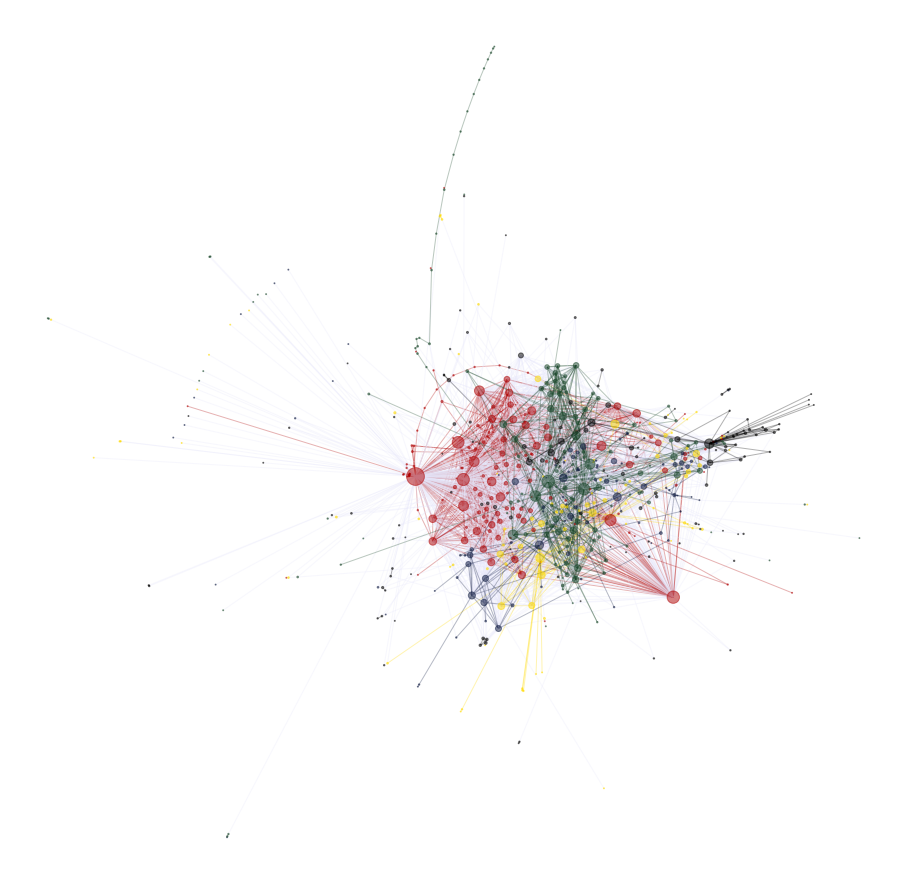

In [228]:
plt.figure(figsize=(16,16)) 
nx.draw_networkx_nodes(uGC, positions, node_size=node_size, node_color=colors, alpha=0.5)
nx.draw_networkx_edges(uGC, positions, edge_color = edge_colors, alpha=0.3)
plt.axis('off')
plt.savefig("NetworkAnalysis/BigGraphWithSeed" + str(seed) + ".png")
plt.show()

The found network shows a network of characters were there certainly is a seperation of characters based on houses - especially for the major houses of Gryffindor (red) and Slytherin (green).
One can also notice larger nodes which are the more popular characters. Who these are will be looked at later on.

#### Subnetworks

To better illustrate each house in the network, subnetworks for each of the five houses are illustrated.

The first house subnetwork found is the Gryffindor house.
All the nodes with characters from Gryffindor will be colored red, the others will be colored a grey-ish color:

In [229]:
colors_G = []

# Assign a color for each node based on their universe
for u in uGC.nodes:
    if uGC.nodes[u]["house"] == "Gryffindor":
        colors_G.append("#AE0001")
    else:
        colors_G.append("Lavender")

And the same goes for the edges

In [230]:
edges = [e for e in uGC.edges]
edge_colors_G = []

# Assigning a color to the edge based on if the universes between the two nodes match or not
for (u,v) in edges:
    if  uGC.nodes[u]["house"] == "Gryffindor" and uGC.nodes[v]["house"] == "Gryffindor":
        edge_colors_G.append("#AE0001") #Gold
    else:
        edge_colors_G.append("Lavender")

Since we already have the positions for the nodes it is simply a manor of plotting the graph

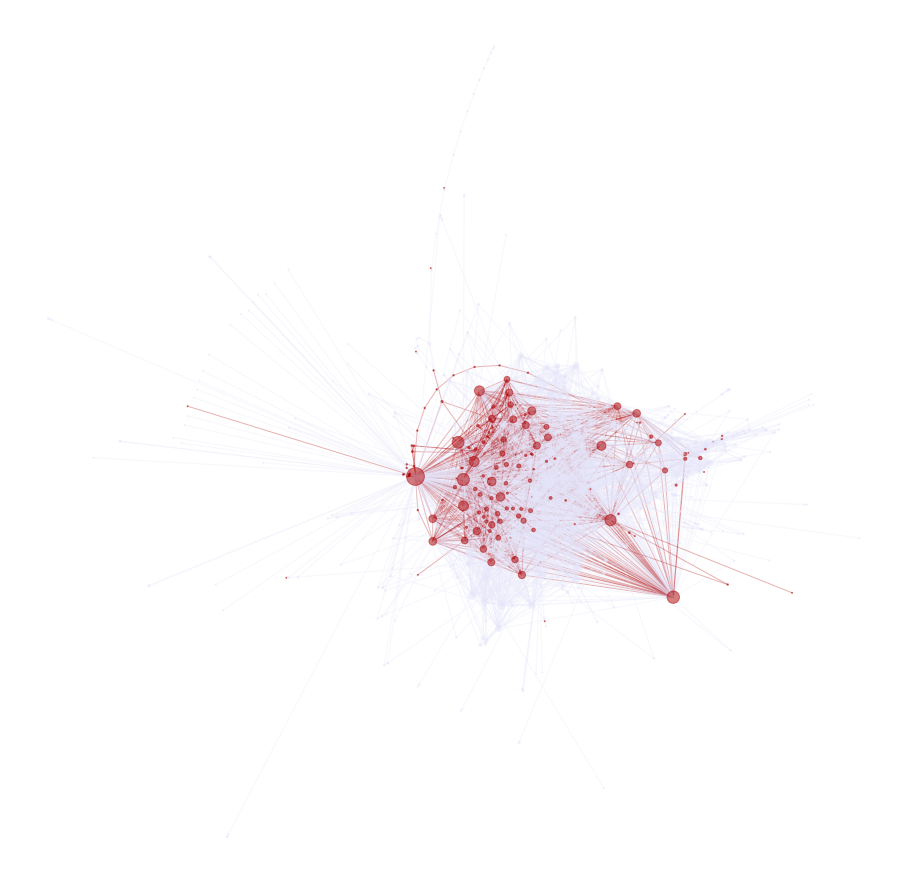

In [231]:
plt.figure(figsize=(16,16)) 
nx.draw_networkx_nodes(uGC, positions, node_size=node_size, node_color=colors_G, alpha=0.5)
nx.draw_networkx_edges(uGC, positions, edge_color = edge_colors_G, alpha=0.3)
plt.axis('off')
plt.savefig("NetworkAnalysis/GryffindorSubnetwork.png")
plt.show()

The same is done for Slytherin, here the nodes and edges are colored green:

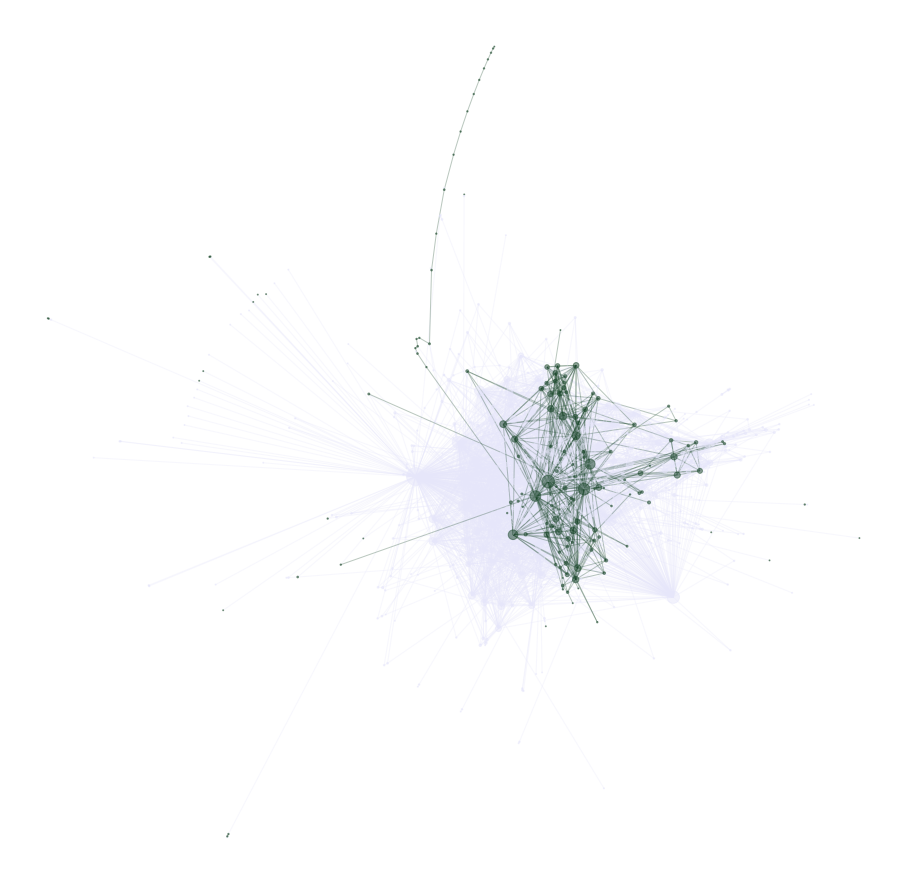

In [232]:
colors_S = []

# Assign a color for each node based on their universe
for u in uGC.nodes:
    if uGC.nodes[u]["house"] == "Slytherin":
        colors_S.append("#1A472A")
    else:
        colors_S.append("Lavender")

edges = [e for e in uGC.edges]
edge_colors_S = []

# Assigning a color to the edge based on if the universes between the two nodes match or not
for (u,v) in edges:
    if  uGC.nodes[u]["house"] == "Slytherin" and uGC.nodes[v]["house"] == "Slytherin":
        edge_colors_S.append("#1A472A") #Gold
    else:
        edge_colors_S.append("Lavender")

plt.figure(figsize=(16,16)) 
nx.draw_networkx_nodes(uGC, positions, node_size=node_size, node_color=colors_S, alpha=0.5)
nx.draw_networkx_edges(uGC, positions, edge_color = edge_colors_S, alpha=0.3)
plt.axis('off')
plt.savefig("NetworkAnalysis/SlytherinSubnetwork.png")
plt.show()

Ravenclaw where the nodes and edges are blue:

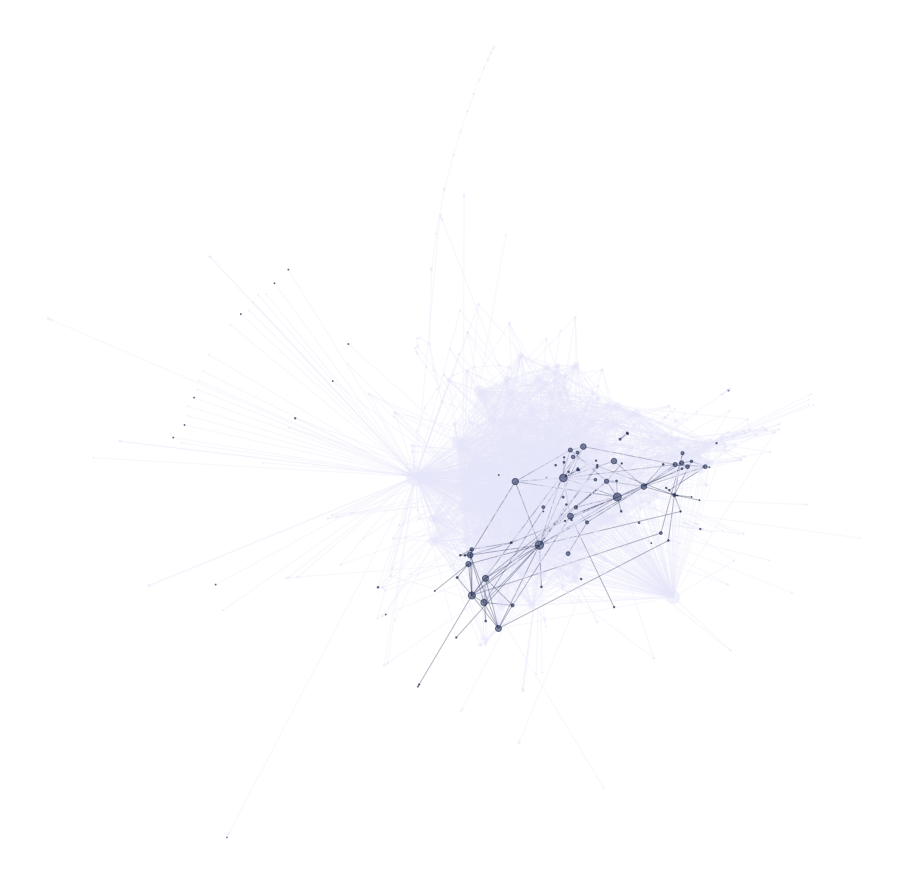

In [233]:
colors_R = []

# Assign a color for each node based on their universe
for u in uGC.nodes:
    if uGC.nodes[u]["house"] == "Ravenclaw":
        colors_R.append("#0E1A40")
    else:
        colors_R.append("Lavender")

edges = [e for e in uGC.edges]
edge_colors_R = []

# Assigning a color to the edge based on if the universes between the two nodes match or not
for (u,v) in edges:
    if  uGC.nodes[u]["house"] == "Ravenclaw" and uGC.nodes[v]["house"] == "Ravenclaw":
        edge_colors_R.append("#0E1A40") #Gold
    else:
        edge_colors_R.append("Lavender")

plt.figure(figsize=(16,16)) 
nx.draw_networkx_nodes(uGC, positions, node_size=node_size, node_color=colors_R, alpha=0.5)
nx.draw_networkx_edges(uGC, positions, edge_color = edge_colors_R, alpha=0.3)
plt.axis('off')
plt.savefig("NetworkAnalysis/RavenclawSubnetwork.png")
plt.show()

Hufflepuff where the nodes and edges will be colored yellow

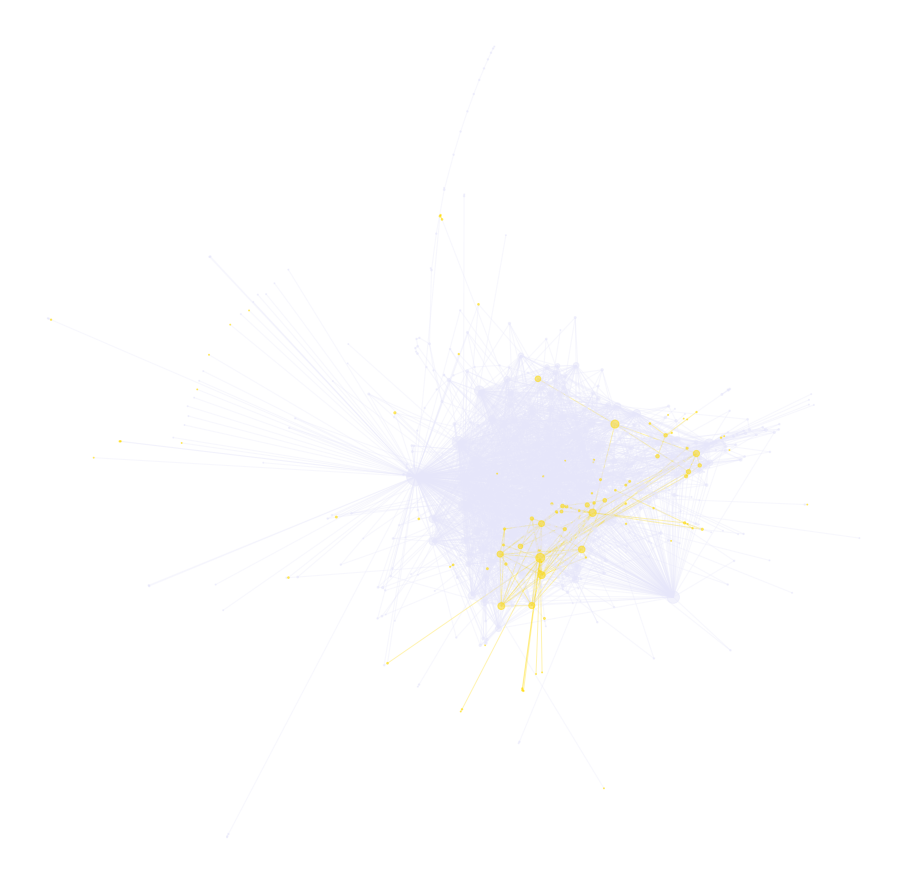

In [234]:
colors_H = []

# Assign a color for each node based on their universe
for u in uGC.nodes:
    if uGC.nodes[u]["house"] == "Hufflepuff":
        colors_H.append("#FFDB00")
    else:
        colors_H.append("Lavender")

edges = [e for e in uGC.edges]
edge_colors_H = []

# Assigning a color to the edge based on if the universes between the two nodes match or not
for (u,v) in edges:
    if  uGC.nodes[u]["house"] == "Hufflepuff" and uGC.nodes[v]["house"] == "Hufflepuff":
        edge_colors_H.append("#FFDB00") 
    else:
        edge_colors_H.append("Lavender")

plt.figure(figsize=(16,16)) 
nx.draw_networkx_nodes(uGC, positions, node_size=node_size, node_color=colors_H, alpha=0.5)
nx.draw_networkx_edges(uGC, positions, edge_color = edge_colors_H, alpha=0.3)
plt.axis('off')
plt.savefig("NetworkAnalysis/HufflepuffSubnetwork.png")
plt.show()

And finally the unknown house where the nodes and edges will be black

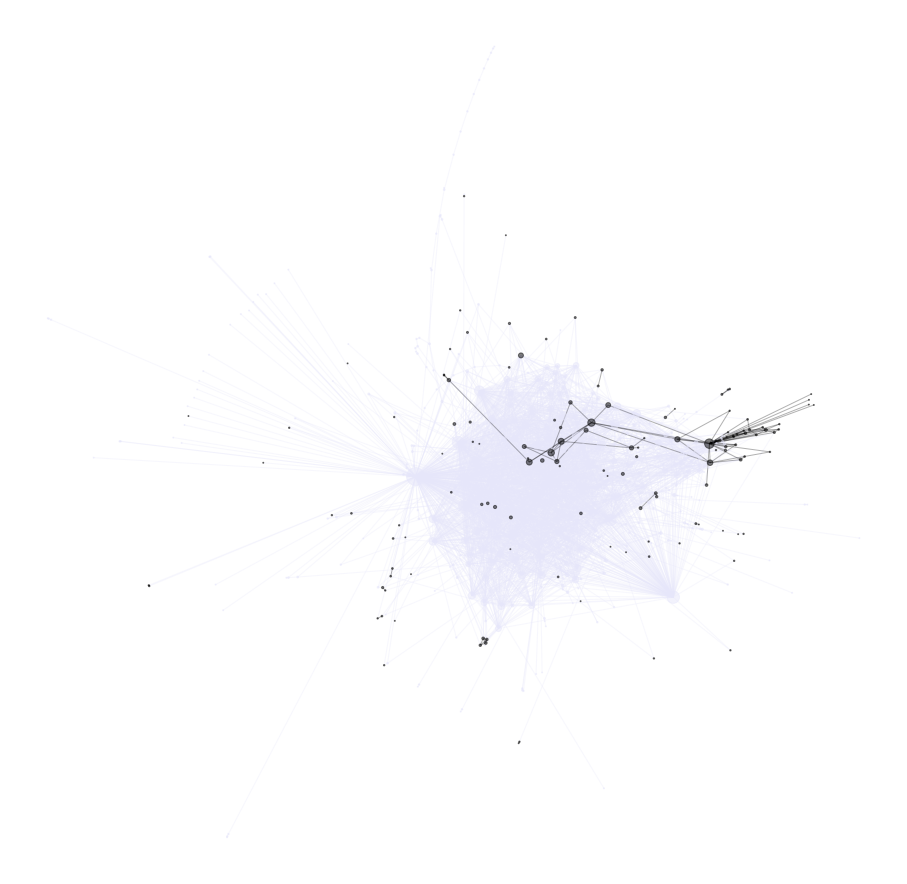

In [235]:
colors_U = []

# Assign a color for each node based on their universe
for u in uGC.nodes:
    if uGC.nodes[u]["house"] == "Unknown House":
        colors_U.append("Black")
    else:
        colors_U.append("Lavender")

edges = [e for e in uGC.edges]
edge_colors_U = []

# Assigning a color to the edge based on if the universes between the two nodes match or not
for (u,v) in edges:
    if  uGC.nodes[u]["house"] == "Unknown House" and uGC.nodes[v]["house"] == "Unknown House":
        edge_colors_U.append("Black") 
    else:
        edge_colors_U.append("Lavender")

plt.figure(figsize=(16,16)) 
nx.draw_networkx_nodes(uGC, positions, node_size=node_size, node_color=colors_U, alpha=0.5)
nx.draw_networkx_edges(uGC, positions, edge_color = edge_colors_U, alpha=0.3)
plt.axis('off')
plt.savefig("NetworkAnalysis/UnknownSubnetwork.png")
plt.show()

#### Degree distribution

Now that we have visualized the graph, it is time to take a look at how the characters are connected to each other.
As a starter, two histograms are plotted: one for the in-degree distribution and one for the out-degree distribution.
To do this, the in- and out-degrees are firstly sorted into two lists in decending order. 
Then the ``np.histogram`` function is ued to create the bins for our histograms:

Max in-degree: 315  Min in degree: 0
Max out-degree: 96  Min out degree: 0


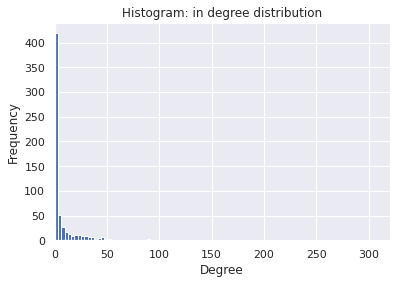

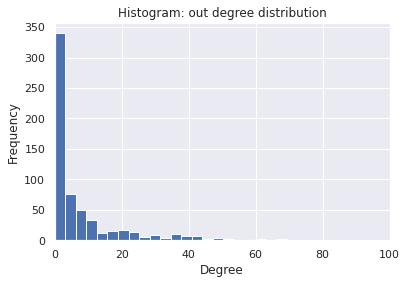

In [236]:
in_degrees = sorted([d for n, d in Gc.in_degree()], reverse=True)
out_degrees = sorted([d for n, d in Gc.out_degree()], reverse=True)

print("Max in-degree:", in_degrees[0], " Min in degree:", in_degrees[-1])
print("Max out-degree:", out_degrees[0], " Min out degree:", out_degrees[-1])

# Creating histogram
in_hist, in_bins = np.histogram(in_degrees, bins=100)
out_hist, out_bins = np.histogram(out_degrees, bins=100)

# Plotting the in degrees based on the bins
plt.hist(in_degrees, bins = in_bins) 
plt.title("Histogram: in degree distribution") 
plt.xlabel("Degree")
plt.ylabel("Frequency")
plt.xlim(0, 320)
plt.savefig("NetworkAnalysis/HistInDegreeDist.png")
plt.show()

# Plotting the in degrees based on the bins
plt.hist(out_degrees, bins = in_bins) 
plt.title("Histogram: out degree distribution") 
plt.xlabel("Degree")
plt.xlim(0,100)
plt.ylabel("Frequency")
plt.savefig("NetworkAnalysis/HistOutDegreeDist.png")
plt.show()

From the plots of degree distributions above, it seems that most of the characters have an in- and out-degree around 0.
It also seems as if the degree distributions follows the power law instead of a poisson distribution. 
Most of the nodes have a very low degree. However there exist nodes with a very high degree value. 
The maximum in degree is at **314** while the max out-degree is at **96**. 

Based on the above information, it is investiagted whether the found network is scale free or if it is closer to a random network. 
To do this the degree distributions are log-transformed:

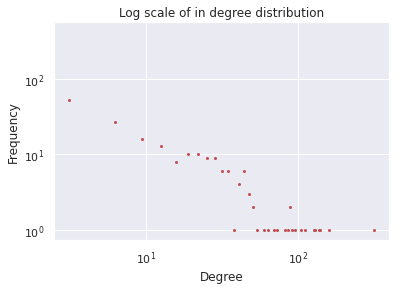

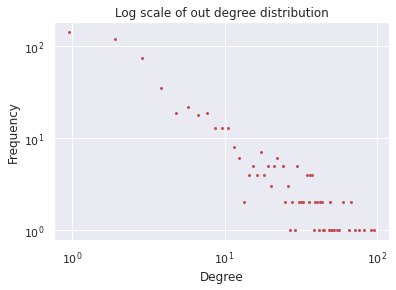

In [237]:
# Plotting the in degrees based on the bins
plt.plot(in_bins[:-1], in_hist, 'ro', markersize=2) 
plt.title("Log scale of in degree distribution") 
plt.xlabel("Degree")
plt.ylabel("Frequency")
plt.xscale("log")
plt.yscale("log")
plt.savefig("NetworkAnalysis/LogInDegreeDist.png", bbox_inches='tight')
plt.show()


# Plotting the out degrees based on the bins
plt.plot(out_bins[:-1], out_hist, 'ro', markersize=2) 
plt.title("Log scale of out degree distribution") 
plt.xlabel("Degree")
plt.ylabel("Frequency")
plt.xscale("log")
plt.yscale("log")
plt.savefig("NetworkAnalysis/LogOutDegreeDist.png", bbox_inches='tight')
plt.show()


The log-log plot of the in-degrees look to be mostly linear which should indicate that the in-degree is indeed following the power law.
However, the out-degree log-log plot could look to be following more of a poisson distribution and thus follow a random network. 
To be sure, the exponent of the degree distrubitions are calculated:

In [238]:
# Calculate exponent
in_exponent = powerlaw.Fit(in_degrees, verbose = False).alpha
out_exponent = powerlaw.Fit(out_degrees, verbose = False).alpha

# Print results
print('In exponent : ', round(in_exponent, 3))
print('Out exponent : ', round(out_exponent, 3))

In exponent :  2.549
Out exponent :  4.309
/opt/venv/lib/python3.7/site-packages/powerlaw.py:700: RuntimeWarning: invalid value encountered in true_divide
  (Theoretical_CDF * (1 - Theoretical_CDF))


Based on the above, it can be concluded that the in-degrees are in fact following a power law and thus shows a scale free network, since 2 < 2.549 < 3.
The out-degrees however looks like they are following a poisson distribution since 4.309 > 3. [Source](http://networksciencebook.com/chapter/4#ultra-small)

It is time to look more into who the most connected characters are based on in- and out-degrees. 
Firstly, a list is created with characters and their in- or out-degree.
Then it is simply a manner of sorting the lists from largest to smallest and outputting the first 5 entries:

In [239]:
# Create arrays containing  degrees and corresponding character
char_in_degrees =  list(Gc.in_degree())
char_out_degrees = list(Gc.out_degree())

# Sort based on degrees 
char_in_degrees.sort(key=lambda x:x[1], reverse=True)
char_out_degrees.sort(key=lambda x:x[1], reverse=True)

print("Top five characters with highest in-degree:")
for (c,d) in char_in_degrees[0:5]:
    print("*",c + ",", d)

print("\nTop five characters with highest out-degree:")
for (c,d) in char_out_degrees[0:5]:
    print("*",c + ",", d)

Top five characters with highest in-degree:
* Harry Potter, 315
* Tom Riddle, 159
* Ronald Weasley, 140
* Albus Dumbledore, 136
* Hermione Granger, 131

Top five characters with highest out-degree:
* Albus Dumbledore, 96
* Harry Potter, 92
* Ronald Weasley, 82
* Hermione Granger, 76
* Minerva McGonagall, 72


Unsurprisingly, the main characters have a high in-degree where Harry Potter is very distinct compared to the rest in terms of the actual value of in-degree. 
The Harry Potter fandom page is also very long (it basically goes through the entire series), it therefore also makes sense, that many characters are described on his page resulting in a high out-degree. 
In second place we see that Tom Riddle (i.e. Lord Voldemort) makes an appearance. 
His in-degree is "only" about half of Harry Potters. 
It makes sense to see him high on the list as well since he is the main antagonist of the Harry Potter series and will thus have had an influence on many characters in the series.
At third place and fifth place we see Ronald Weasley and Hermione Granger who are Harry's two best friends in the series. 
They both play large roles throughout the story and most of the time where Harry goes, one or both of them follows. 
The character in fourth place in the top five in-degree list is Albus Dumbledore who is the headmaster of Hogwarts - the school Harry goes to.

Most of the characters from the in-degree top five re-appears in the top five out-degree list. 
However Tom Riddle is swapped for Minerva McGonnagall, who is a professor at their school, who comes in in fifth place. 
Albus Dumbledroe has overtaken Harry Potter in the list and lead with a small amount. 
This could be explained by Albus Dumbledore appearing in both the original Harry Potter stories but also the "Fantastic beasts and where to find them" stories. 
At third and fourth place we again see Ronald Weasley and Hermione Granger.

### Books and movies

As stated, the collection for the book text were fairly simple. 
With a given url to the raw files at GitHub, requests could be made for each book:

In [240]:
# Download the book transcripts from the github page containing extracted book transcripts and save to files
for i in range(1,8):
    url = "https://raw.githubusercontent.com/ErikaJacobs/Harry-Potter-Text-Mining/master/Book%20Text/HPBook" + str(i) + ".txt"
    text = urllib.request.urlopen(url).read().decode('utf-8')
    book_location = "Book_text_files/" + "book" + str(i) + ".txt"
    file_book = open(book_location, "w")
    file_book.write(text)
    file_book.close()

In addition, the book texts were actually in csv-format seperated into three columns: the actual text, the chapter and the book.
It is therefore possible to generate a convenient Pandas `Dataframe`.
The csv-format in this case uses '@' as seperator. 
Finally, when creating a data frame from a file, Pandas automatically generates indices if not present.
A problem arises when reading multiple files and when you then concat them.
Each file read will start with index of 0.
Therefore when concatenating, the parameter `ignore_index` is used.
The result is one long data frame for all the books:

In [241]:
## Create a pandas data frame containing all books

# List of book names:
books = ["Harry Potter and the Philosopher's Stone", "Harry Potter and the Chamber of Secrets", "Harry Potter and the Prisoner of Azkaban", "Harry Potter and the Goblet of Fire", "Harry Potter and the Fenix Order", "Harry Potter and the Half Blood Prince", "Harry Potter and the Deathly Hallows"]

# Initially empty with specified column header names
book_df = pd.DataFrame(columns = ["Text", "Chapter", "Book"])

# Go through each book textfile and read as csv with @ as seperator and finally concat with dataframe
for i in range(len(books)):
    df = pd.read_csv("Book_text_files/book" + str(i+1) + ".txt",  sep="@")
    book_df = pd.concat([book_df, df], ignore_index=True)

book_df

,Text,Chapter,Book
0,"THE BOY WHO LIVED Mr. and Mrs. Dursley, of nu...",1,1
1,THE VANISHING GLASS Nearly ten years had pass...,2,1
2,THE LETTERS FROM NO ONE The escape of the Bra...,3,1
3,THE KEEPER OF THE KEYS BOOM. They knocked aga...,4,1
4,DIAGON ALLEY Harry woke early the next mornin...,5,1
...,...,...,...
195,"Harry remained kneeling at Snape's side, simpl...",33,7
196,"Finally, the truth. Lying with his face presse...",34,7
197,"He lay facedown, listening to the silence. He ...",35,7
198,He was flying facedown on the ground again. Th...,36,7


With the book texts downloaded, it is time to download the transcripts for the movies. However, this is not as easy of a task as with the books.  
The transcripts of the book can be found on [Hogwart is here](https://www.hogwartsishere.com/library/book/12647/). 
However, the transcripts themselves can not be downloaded raw and the webpage does not contain any sort of API. 
It is therefore necessary to scrape each film transcript content manually.
To do this, the `BeautifulSoup` module is used. 
When opening the url, one gets a html-document. 
`BeautifulSoup` can then use a html parser to look for tags in the html-code and create a class structure. 
This makes it easier to find and extract elements of the webpage.
To actually find the wanted elements of the page one needs to look into how the actual page is structured. 
By examining (i.e. using inspect elements directly on the pages) the different movie transcript pages, it is found that they are contained in `divs` with a specific class of `font-size-16 roboto`. 
This is therefore used to find the actual text:

In [242]:
# Iterate through each movie from 1 to 8
for i in range(1, 9):
    url = "https://www.hogwartsishere.com/library/book/12647/chapter/" + str(i) + "/"
    # Get html from url
    html = urllib.request.urlopen(url).read().decode('utf-8')

    # Create soup class using html tags parser
    soup_html = bsoup(html, 'html.parser')

    # After looking at the pages, the actual transcripts lies in divs
    # containing class 'font-size-16 roboto', this is therefore used to
    # find div with the transcript
    soup_div = soup_html.find(class_="font-size-16 roboto")

    # Get the actual text from the div
    text = soup_div.get_text(separator=" ").strip()

    # Open movie file and write
    movie_location = "Movie_text_files/" + "movie" + str(i) + ".txt"
    file_movie = open(movie_location, "w")
    file_movie.write(text)
    file_movie.close()
    

It is the case that the movie transcripts are not as detailed as the ones for the books.
The movie transcripts are thus used only as plain txt-files in this project.

To do any text analysis, the text of each book and film is tokenized and the frequency distribution is found for each word in the text. Let's begin with the book.

For the books, the text is read from the corresponding text file.
The text is then tokenized using the `nltk` module.
Since some tokens can occur in different cases, all tokens are made into lower case.
Since the `word_tokenize` function also finds punctuations as tokens, they are removed with some regex: `[^\w\s]` that makes sure that only words are found.
If the after regex replacement has a smaller length of $1$ (i.e. it is a single punctuation), it is removed altogether.
It should be noted that lemmatization is not used for this project.

Time to find the terms and their frequencies:

In [243]:
books_freq = dict()

# Iterate through each book, find tokens (i.e. words) and create frequency lists
for i in range(1,8):
    book_location = "Book_text_files/" + "book" + str(i) + ".txt"
    file_book = open(book_location, "r")
    text = file_book.read()
    file_book.close()
    tokens = word_tokenize(text)

    # lower case tokens
    words = [w.lower() for w in tokens]
    # remove punctuations
    words = [w for w in words if len(re.sub(r'[^\w\s]','',w)) > 1]

    print("Number of tokens for book " + str(i) +":", len(words))

    freq_dist = nltk.FreqDist(words)
    books_freq[i] = freq_dist 

Number of tokens for book 1: 76214
Number of tokens for book 2: 83362
Number of tokens for book 3: 102913
Number of tokens for book 4: 187461
Number of tokens for book 5: 252125
Number of tokens for book 6: 165773
Number of tokens for book 7: 192745


As one can see, the found amount of words generally increases with the book number, this luckily fits with the books had a tendency to become longer for each book.

The ten most common words of each books are:

In [244]:
for book in books_freq:
    print("Most common words in book", str(book) + ":", books_freq[book].most_common(10))

Most common words in book 1: [('the', 3625), ('and', 1916), ('to', 1853), ('he', 1756), ('harry', 1317), ('was', 1261), ('of', 1256), ('it', 1167), ('you', 987), ('in', 962)]
Most common words in book 2: [('the', 4085), ('and', 2157), ('to', 2017), ('harry', 1638), ('of', 1629), ('he', 1523), ('was', 1329), ('said', 1206), ('it', 1187), ('his', 1162)]
Most common words in book 3: [('the', 4983), ('and', 2610), ('to', 2551), ('he', 2057), ('of', 2022), ('harry', 1993), ('was', 1730), ('his', 1468), ('said', 1435), ('it', 1375)]
Most common words in book 4: [('the', 9292), ('and', 4943), ('to', 4785), ('he', 3971), ('of', 3900), ('harry', 3114), ('was', 2867), ('said', 2633), ('his', 2578), ('it', 2340)]
Most common words in book 5: [('the', 11696), ('to', 6508), ('and', 5966), ('of', 5275), ('he', 4825), ('harry', 3980), ('said', 3911), ('was', 3673), ('his', 3248), ('in', 3059)]
Most common words in book 6: [('the', 7472), ('to', 4283), ('and', 4028), ('he', 3523), ('of', 3400), ('harr

As seen, the most common words are ordinary stop words. 
Are not that useful for later text analysis. However, they are not removed as it will be explained later on. 

Time to do the same for the movies. The same steps applies as with the tokenization of the books:

In [245]:
movie_freq = dict()

# Iterate through each book, find tokens (i.e. words) and create frequency lists
for i in range(1,9):
    movie_location = "Movie_text_files/" + "movie" + str(i) + ".txt"
    file_movie = open(movie_location, "r")
    text = file_movie.read()
    file_movie.close()
    tokens = word_tokenize(text)

    # lower case tokens
    words = [w.lower() for w in tokens]
    # remove punctuations
    words = [w for w in words if len(re.sub(r'[^\w\s]','',w)) > 1]

    print("Number of tokens for movie " + str(i) +":", len(words))

    freq_dist = nltk.FreqDist(words)
    movie_freq[i] = freq_dist 

Number of tokens for movie 1: 18169
Number of tokens for movie 2: 11393
Number of tokens for movie 3: 9358
Number of tokens for movie 4: 12790
Number of tokens for movie 5: 8283
Number of tokens for movie 6: 9031
Number of tokens for movie 7: 6371
Number of tokens for movie 8: 5175


As one can see, the number of words actually decrease with each movie. 
It is only the first four movie transcripts that contains which character that says what and description on where the scene takes place. 
Therefore, the last four film transcripts naturally contains less amount of words since they are less detailed.
Another thing that could cause this is that the later movies are more serious and contains more action which would result in less dialogue. 

The most common words of each movie are:

In [246]:
for movie in movie_freq:
    print("Most common words in movie", str(movie) + ":", movie_freq[movie].most_common(10))

Most common words in movie 1: [('the', 943), ('harry', 581), ('and', 518), ('to', 437), ('you', 330), ('it', 268), ('in', 247), ('is', 238), ('he', 224), ('of', 203)]
Most common words in movie 2: [('the', 743), ('harry', 368), ('to', 316), ('and', 306), ('you', 195), ('of', 188), ('ron', 180), ('at', 159), ('it', 157), ('in', 151)]
Most common words in movie 3: [('you', 407), ('the', 297), ('to', 233), ('it', 217), ('that', 145), ("n't", 126), ('harry', 120), ('of', 119), ('he', 114), ('and', 113)]
Most common words in movie 4: [('the', 615), ('harry', 370), ('you', 355), ('to', 276), ('and', 274), ('it', 190), ('of', 175), ('in', 159), ('he', 150), ('is', 148)]
Most common words in movie 5: [('you', 361), ('the', 281), ('to', 225), ('it', 181), ('of', 138), ("n't", 115), ('is', 105), ('that', 100), ('and', 94), ('he', 89)]
Most common words in movie 6: [('you', 443), ('to', 269), ('the', 234), ('it', 219), ("n't", 156), ('is', 119), ('do', 115), ('of', 114), ('what', 108), ('and', 10

Like with the books, ordinary stop words are most common. 
However, in the earlier books 'Harry' is very prominent. 
This is most certainly due to these transcripts containing who says what.
Since Harry is the main character he has a lot of dialogue.

## Tools, theory and analysis


The following section will describe the process of theory to insight. The overall idea of the project was to analyse the different aspects of houses at Hogwarts. It was wanted to analyse both how connected houses are and if they can be considered communities (based on the Fandom Wikipages that is). 
Based on text analysis, the traits of the houses are considered and representation change through out the books.

As mentioned, the ideas about examining the houses is extended with some more general analyses about the books and movies. These includes to try to find the unique words of each book and movie, comparision between them and finally looking at the use of spells through out the story.

The following section is thus devided into the main idea of analysing houses where each analysis step is a sub-section, a section about book-specific analysis with relevant sub analysis steps and finally a sectino for the movies.

### House Analysis

#### Connections between houses

To get a better understanding of how the characters from different houses interact with each other, it is investigated where the edges from each house points too.
First a list for each house is created that only consists of characters from that specific house and counts every time a character from that house appears:

In [247]:
gryff_nodes = 0
gryff_list = []
raven_nodes = 0
raven_list = []
slyth_nodes = 0
slyth_list = []
huffp_nodes = 0
huffp_list = []
nohou_nodes = 0
nohou_list = []
for u in G.nodes:
    if G.nodes[u]["house"] == "Gryffindor":
        gryff_nodes += 1
        gryff_list.append(u)
    elif G.nodes[u]["house"] == "Slytherin":
        slyth_nodes += 1
        slyth_list.append(u)
    elif G.nodes[u]["house"] == "Ravenclaw":
        raven_nodes += 1
        raven_list.append(u)
    elif G.nodes[u]["house"] == "Hufflepuff":
        huffp_nodes += 1
        huffp_list.append(u)
    elif G.nodes[u]["house"] == "Unknown House":
        nohou_nodes += 1
        nohou_list.append(u)
print("There is {} nodes in the Gryffindor house".format(gryff_nodes))
print("There is {} nodes in the Slytherin house".format(slyth_nodes))
print("There is {} nodes in the Ravenclaw house".format(raven_nodes))
print("There is {} nodes in the Hufflepuff house".format(huffp_nodes))
print("There is {} nodes in the Unknown house".format(nohou_nodes))

There is 160 nodes in the Gryffindor house
There is 151 nodes in the Slytherin house
There is 99 nodes in the Ravenclaw house
There is 99 nodes in the Hufflepuff house
There is 146 nodes in the Unknown house


So there are most characters in the Gryffindor house, second most are Slytherin, the unknown house and then tied for last are Ravenclaw and Hufflepuff.

It is then found how edges are between houses. The number of edges between nodes per houses is counted as well as the amount of cross-house edges:


In [248]:
connecting_edges = 0
gryff_edges = 0
gryff_gryff_edges = 0
gryff_slyth_edges = 0
gryff_raven_edges = 0
gryff_huffp_edges = 0
gryff_nohou_edges = 0
raven_edges = 0
raven_gryff_edges = 0
raven_slyth_edges = 0
raven_raven_edges = 0
raven_huffp_edges = 0
raven_nohou_edges = 0
slyth_edges = 0
slyth_gryff_edges = 0
slyth_slyth_edges = 0
slyth_raven_edges = 0
slyth_huffp_edges = 0
slyth_nohou_edges = 0
huffp_edges = 0
huffp_gryff_edges = 0
huffp_slyth_edges = 0
huffp_raven_edges = 0
huffp_huffp_edges = 0
huffp_nohou_edges = 0
nohou_edges = 0
nohou_gryff_edges = 0
nohou_slyth_edges = 0
nohou_raven_edges = 0
nohou_huffp_edges = 0
nohou_nohou_edges = 0
edges = [e for e in G.edges]

# Checking if the universe attribute for the two connecting nodes either match or not
for (u,v) in edges:
    if G.nodes[u]["house"] != G.nodes[v]["house"]:
        connecting_edges += 1

    if G.nodes[u]["house"] == "Gryffindor":
        gryff_edges += 1
        if G.nodes[v]["house"] == "Gryffindor":
            gryff_gryff_edges += 1
        
        elif G.nodes[v]["house"] == "Slytherin":
            gryff_slyth_edges += 1

        elif G.nodes[v]["house"] == "Ravenclaw":
            gryff_raven_edges += 1

        elif G.nodes[v]["house"] == "Hufflepuff":
            gryff_huffp_edges += 1

        elif G.nodes[v]["house"] == "Unknown House":
            gryff_nohou_edges += 1

    elif G.nodes[u]["house"] == "Slytherin":
        slyth_edges += 1
        if G.nodes[v]["house"] == "Gryffindor":
            slyth_gryff_edges += 1
        
        elif G.nodes[v]["house"] == "Slytherin":
            slyth_slyth_edges += 1

        elif G.nodes[v]["house"] == "Ravenclaw":
            slyth_raven_edges += 1

        elif G.nodes[v]["house"] == "Hufflepuff":
            slyth_huffp_edges += 1

        elif G.nodes[v]["house"] == "Unknown House":
            slyth_nohou_edges += 1

    elif G.nodes[u]["house"] == "Ravenclaw":
        raven_edges += 1
        if G.nodes[v]["house"] == "Gryffindor":
            raven_gryff_edges += 1
        
        elif G.nodes[v]["house"] == "Slytherin":
            raven_slyth_edges += 1

        elif G.nodes[v]["house"] == "Ravenclaw":
            raven_raven_edges += 1

        elif G.nodes[v]["house"] == "Hufflepuff":
            raven_huffp_edges += 1

        elif G.nodes[v]["house"] == "Unknown House":
            raven_nohou_edges += 1

    elif G.nodes[u]["house"] == "Hufflepuff":
        huffp_edges += 1
        if G.nodes[v]["house"] == "Gryffindor":
            huffp_gryff_edges += 1
        
        elif G.nodes[v]["house"] == "Slytherin":
            huffp_slyth_edges += 1

        elif G.nodes[v]["house"] == "Ravenclaw":
            huffp_raven_edges += 1

        elif G.nodes[v]["house"] == "Hufflepuff":
            huffp_huffp_edges += 1

        elif G.nodes[v]["house"] == "Unknown House":
            huffp_nohou_edges += 1

    elif G.nodes[u]["house"] == "Unknown House":
        nohou_edges += 1
        if G.nodes[v]["house"] == "Gryffindor":
            nohou_gryff_edges += 1
        
        elif G.nodes[v]["house"] == "Slytherin":
            nohou_slyth_edges += 1

        elif G.nodes[v]["house"] == "Ravenclaw":
            nohou_raven_edges += 1

        elif G.nodes[v]["house"] == "Hufflepuff":
            nohou_huffp_edges += 1

        elif G.nodes[v]["house"] == "Unknown House":
            nohou_nohou_edges += 1
print("There are {} edges going between the houses".format(connecting_edges))
print("There are {} edges between nodes in the Gryffindor house".format(gryff_gryff_edges))
print("There are {} edges between nodes in the Slytherin house".format(slyth_slyth_edges))
print("There are {} edges between nodes in the Ravenclaw house".format(raven_raven_edges))
print("There are {} edges between nodes in the Hufflepuff house".format(huffp_huffp_edges))
print("There are {} edges between nodes in the Unknown house".format(nohou_nohou_edges))

There are 3273 edges going between the houses
There are 1122 edges between nodes in the Gryffindor house
There are 719 edges between nodes in the Slytherin house
There are 159 edges between nodes in the Ravenclaw house
There are 147 edges between nodes in the Hufflepuff house
There are 151 edges between nodes in the Unknown house


It can be seen that there are a total of **3272 edges** going between characters from different houses. 
When looking at edges between characters from the same house, Gryffindor again takes the lead with **1122 edges**, followed by Slytherin with **719 edges**. 
Then comes Ravenclaw with **159 edges**, the unknown house with **151 edges** and finally Hufflepuff with **147 edges**.

The number of nodes and edges for each house is plotted to get a better overview:

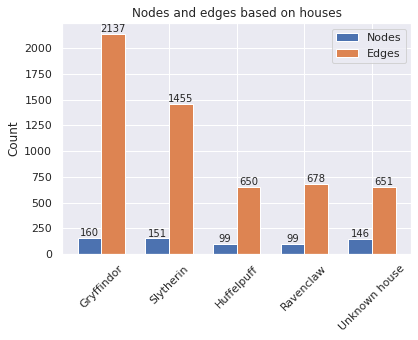

In [249]:
houses = ["Gryffindor","Slytherin","Huffelpuff","Ravenclaw","Unknown house"]
nodes = [gryff_nodes, slyth_nodes, huffp_nodes, raven_nodes, nohou_nodes]
edges = [gryff_edges, slyth_edges, huffp_edges, raven_edges, nohou_edges]

x = np.arange(len(houses))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, nodes, width, label='Nodes')
rects2 = ax.bar(x + width/2, edges, width, label='Edges')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Count')
ax.set_title('Nodes and edges based on houses')
ax.set_xticks(x)
ax.set_xticklabels(houses)
ax.legend()


def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 0),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.xticks(rotation=45)
plt.savefig("NetworkAnalysis/NodesAndEdgesAllHouses.png", bbox_inches='tight')
plt.show()

As seen above, the amount of edges for each house is much higher than the amount of nodes.

Finally, a plot for each house is made to indicate which houses each house points to through edges: 

<Figure size 1152x1152 with 0 Axes>

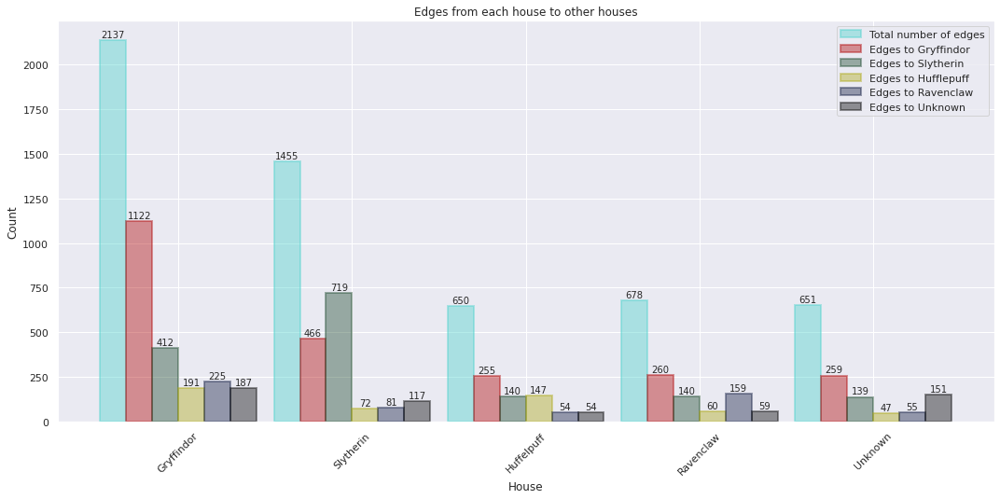

In [250]:
plt.figure(figsize=(16,16)) 

houses = ["Gryffindor","Slytherin","Huffelpuff","Ravenclaw","Unknown"]
edges = [gryff_edges, slyth_edges, huffp_edges, raven_edges, nohou_edges]
edges_to_gryff = [gryff_gryff_edges, slyth_gryff_edges, huffp_gryff_edges, raven_gryff_edges, nohou_gryff_edges]
edges_to_slyth = [gryff_slyth_edges, slyth_slyth_edges,huffp_slyth_edges, raven_slyth_edges, nohou_slyth_edges]
edges_to_huffp = [gryff_huffp_edges, slyth_huffp_edges, huffp_huffp_edges, raven_huffp_edges, nohou_huffp_edges]
edges_to_raven = [gryff_raven_edges, slyth_raven_edges, huffp_raven_edges, raven_raven_edges, nohou_raven_edges]
edges_to_nohou = [gryff_nohou_edges, slyth_nohou_edges, huffp_nohou_edges, raven_nohou_edges, nohou_nohou_edges]

x = np.arange(len(houses))  # the label locations
w = 0.15  # the width of the bars
opacity = 0.4

fig, ax = plt.subplots(figsize=(15,7))



rects1 = ax.bar(x - w * 3 + w/2, edges,          w, label='Total number of edges', color="mediumturquoise",alpha=opacity, edgecolor ="mediumturquoise", linewidth =2)
rects2 = ax.bar(x - w * 2 + w/2, edges_to_gryff, w, label='Edges to Gryffindor',   color="#AE0001", alpha=opacity, edgecolor ="#AE0001",  linewidth =2)
rects3 = ax.bar(x - w + w/2 ,    edges_to_slyth, w, label='Edges to Slytherin',    color="#1A472A", alpha=opacity, edgecolor ="#1A472A",  linewidth =2)
rects4 = ax.bar(x + w/2,         edges_to_huffp, w, label='Edges to Hufflepuff',   color="#ADA811", alpha=opacity, edgecolor ="#ADA811",  linewidth =2)
rects5 = ax.bar(x + w + w/2 ,    edges_to_raven, w, label='Edges to Ravenclaw',    color="#0E1A40", alpha=opacity, edgecolor ="#0E1A40",  linewidth =2)
rects6 = ax.bar(x + w * 2 + w/2, edges_to_nohou, w, label='Edges to Unknown',      color="Black",   alpha=opacity, edgecolor ="Black",    linewidth =2)


# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Count')
ax.set_xlabel('House')
ax.set_title('Edges from each house to other houses')
ax.set_xticks(x)
ax.set_xticklabels(houses)
ax.legend()


def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 1),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)
autolabel(rects3)
autolabel(rects4)
autolabel(rects5)
autolabel(rects6)
fig.tight_layout()

plt.xticks(rotation=45)
plt.savefig("NetworkAnalysis/EdgesFromAll.png", bbox_inches='tight')
plt.show()

From the above plot, it can be seen that there are some different behaviours for who the characters are connected to depending on which house you are from. 
An example is the edges that goes out from Gryffindor characters. One can see that as before there are **2138 edges** starting in nodes with the house Gryffindor.
From this total amount of edges, **1122 edges** point to another node within the Gryffindor house, **413** point to a Slytherin node, **191** to a Hufflepuff node, **225** to a Ravenclaw node and finally **187** to a node in the Unknown house. 
Generally one can see that the house that most edges point to within a house is Gryffindor. 
This is the case in every house except Slytherin where their own house is the most pointed to. 
In second place it is mostly the house pointing to itself, expect Gryffindor and Slytherin who points to each other. 
For Hufflepuff, Ravenclaw and the Unknown house their third most pointed to is Slytherin where Gryffindors third most pointed to is Ravenclaw and Slytherins third is the Unknown house. 
For all of the houses the last two is typically pretty close.

All in all, one can see that there is a lot of cross-house edges in the network. Houses are perhaps not the best method of seperating characters into communities.

#### Community detection
From the results above it was interesting to explore communties a bit for the characters at Hogwarts.
More precisely, the hypothesis that communities at Hogwarts based on the Fandom pages reflects the houses will be tested.  
To test this hypothesis, a community detection algorithm is performed. 
The interest lies in finding the largest communities and the corresponding house distributions for each to either confirm or dismiss the hypothesis. 
The used community detection algorithm used to perform partitioning of the network is the Python implementation of the [Louvain algorithm](https://github.com/taynaud/python-louvain). 
The implementation also makes it easy to find the modularity that describes how well-defined communties are. 
When the communities have been found, the house attribute for each node makes it easy to determine the distribution of houses in each community. 

First, the directed graph is transformed into an undirected graph.
Then the Louvain algorithm is applied:


In [251]:
# find the communities
unGc = Gc.to_undirected()
partition = community_louvain.best_partition(unGc)

Then we take a look at the modularity:

In [252]:
# Find modularity
M = community_louvain.modularity(partition, unGc)
print("Modularity of the partitions is", M)

Modularity of the partitions is 0.3320530558364354


In our case the modularity is $M\approx0.33$. 
The modularity thus lies between being a optimal partition and a suboptimal partition. 
This deems the partion good enough to continue working with, since the modularity confirms that thecommunites found are meaningful. 

![Modularity](modularity.png)

Image taken from the [Network Science book](http://networksciencebook.com/chapter/9#modularity)

A dictionary is created, called `communities` where the key is the community number given in the partition,
and the value is a list containing all characters in the community by simply looping though `partition`:

In [253]:
# create a dict with key = community number and value is list of characters in the community.
communities = {}

for character in partition: # for each community 
    key_val = partition[character] # find community for character

    communities.setdefault(key_val, []).append(character)

The algorithm finds $11$ communities within the network (found by: `len(set(partition.values()))`).
The largest community contains $123$ characters and the smallest contains only $5$ characters.

Now the house distribution for each community is found. 
Using a nested loop, each community is iterated through and for each charater in the community, the house attribute is extracted. 
The code used for finding the house distribution can be found below:

In [254]:
# create dict key = community, value is dict with key = house and value is list with charecters
house_dist_community = {}

for community in communities:

    dist_dict = {}
    for character in communities[community]:
        house =  Gc.nodes[ character]['house'] 
        dist_dict.setdefault(house, []).append(character) 

    house_dist_community[community] = dist_dict   

The top five largest communities are selected for further analysis. 
The community number and size are stored in the dictionary `five_com`:

In [255]:
# find 5 larges communities

comm_sizes = dict()

# Find the sizes of each community
# save as a dictionary
for p in partition.values():
    if p not in comm_sizes.keys():
        comm_sizes[p] = 1
    else:
        comm_sizes[p] += 1

In [256]:
#sort communities by size
comm_sizes_sorted = dict(sorted(comm_sizes.items(), key=lambda item: item[1], reverse=True))

# The five larges communities:
five_com = list(comm_sizes_sorted.items())[:5]


In order to visualize the house distibution for each community, a list of lists called `dist_house` is created.
This data structure is made out of a outer list containing the communities where each inner list contains the number of characters from each house in the order: \[Gryffindor, Hufflepuff, Ravenclaw, Slytherin, Unknown  house\]. 
Code for creating the `dist_house` can be found below:


In [257]:
dist_house = []

for i in five_com:
    dic = house_dist_community[i[0]]
    students = []

    for house in dic:
        students.append(len(dic[house]))

    dist_house.append(students)

It is now time for visualizing the house distribution for each of the five largest communities:  

<Figure size 1152x1152 with 0 Axes>

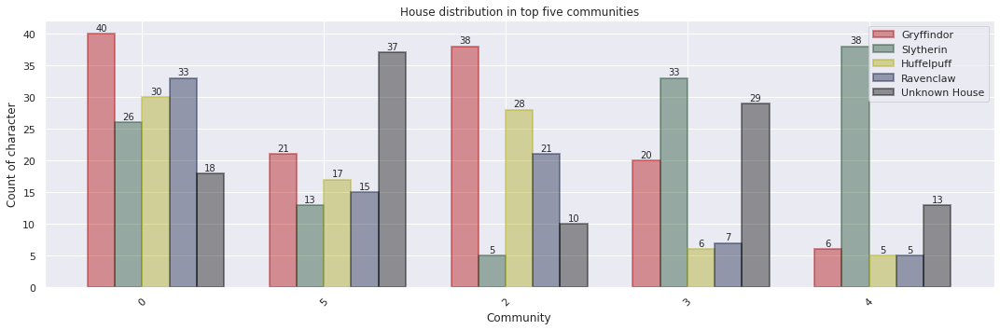

In [258]:
plt.figure(figsize=(16,16)) 

houses = [str(five_com[0][0]),str(five_com[1][0]),str(five_com[2][0]),str(five_com[3][0]),str(five_com[4][0])]

x = np.arange(len(houses))  # the label locations
w = 0.15  # the width of the bars
opacity = 0.4

gryff = [dist_house[0][0], dist_house[1][0], dist_house[2][0], dist_house[3][0], dist_house[4][0]]
huff = [dist_house[0][1], dist_house[1][1], dist_house[2][1], dist_house[3][1], dist_house[4][1]]
rav = [dist_house[0][2], dist_house[1][2], dist_house[2][2], dist_house[3][2], dist_house[4][2]]
slyth = [dist_house[0][3], dist_house[1][3], dist_house[2][3], dist_house[3][3], dist_house[4][3]]
unkno = [dist_house[0][4], dist_house[1][4], dist_house[2][4], dist_house[3][4], dist_house[4][4]]

fig, ax = plt.subplots(figsize=(15,5))

rects2 = ax.bar(x - w * 2 + w/2, gryff, w, label='Gryffindor',   color="#AE0001", alpha=opacity, edgecolor ="#AE0001",  linewidth =2)
rects3 = ax.bar(x - w + w/2 ,    slyth, w, label='Slytherin',    color="#1A472A", alpha=opacity, edgecolor ="#1A472A",  linewidth =2)
rects4 = ax.bar(x + w/2,    huff, w, label='Huffelpuff',    color="#ADA811", alpha=opacity, edgecolor ="#ADA811",  linewidth =2)
rects5 = ax.bar(x + w + w/2,         rav, w, label='Ravenclaw',   color="#0E1A40", alpha=opacity, edgecolor ="#0E1A40",  linewidth =2)
rects6 = ax.bar(x + w * 2 + w/2, unkno, w, label='Unknown House',      color="Black",   alpha=opacity, edgecolor ="Black",    linewidth =2)


# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Count of character')
ax.set_xlabel('Community')
ax.set_title('House distribution in top five communities')
ax.set_xticks(x)
ax.set_xticklabels(houses)
ax.legend()


def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 1),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')



autolabel(rects2)
autolabel(rects3)
autolabel(rects4)
autolabel(rects5)
autolabel(rects6)
fig.tight_layout()

plt.xticks(rotation=45)
plt.savefig("NetworkAnalysis/communities.png")
plt.show()

The plot of how the house distribution can be seen above. The plot of house distribution for each of the largest five communities clearly shows that communities are not created within the houses of Hogwarts.
In fact all of the five largest communities consist of characters from each Hogwarts house and characters from unknown house.



#### TF-IDF and wordclouds for houses



One aspect of the Harry Potter universe which the group wished to examine was whether the house traits were to be
found when doing text analysis on the fandom page data. According to [fandom](https://harrypotter.fandom.com/wiki/Hogwarts_Houses) 
the four houses have the following traits; Gryffindor is brave, Slytherin is cunning, Ravenclaw is wise and Hufflepuff is loyal. 
To analyse this, TF-IDF weighting of tokens on the house pages will be calculted and visualized with wordclouds. 

The first step is to create one large text document for each house by concatenating all character pages in their corresponding house. 
Then the frequency for each word/term is found in each “house text”. 
Since it is wanted to examine whether the house traits are present in the character pages, adjectives and adverbs are only of interest, since these words are descriptive and therefore might reveal the traits. 
Therefore, a part of the `nltk` module called `ordnet` is used to create an adjective and adverb list.
Now we can remove all words which are not adjectives or adverbs. 
 
When the words and the corresponding frequencies are found, the TF-IDF is calculated. 
The [wikipedia page](https://en.wikipedia.org/wiki/Tf%E2%80%93idf) for TF-IDF was used to find the best possible 
combination.
Through trial and error, it was found that a TF-IDF weighting scheme using double normalization as
term frequency gave the best results:
 
$TF = 0.5 + 0.5 \cdot \frac{f_{t,d}}{max_{\{t' \in d\}} f_{t',d}}$
 
where $f_{t,d}$ describes the frequency of word $t$ in document $d$.
This version of term frequency is great in this case since the "house text" are of different 
lengths where Gryffindor and Slytherin are the longest and Hufflepuff and Ravenclaw are much shorter.
In addition, using a regular inverse document frequency gave the best result: 

$IDF = \log{\frac{N}{n_t}},$

where $N$ is the number of documents and $n_t$ is the number of documents the word $t$ occurs in.
 
Therefore, the final TF-IDF is:

$\text{TF-IDF} = 0.5 + 0.5 \cdot \frac{f_{t,d}}{max_{\{t' \in d\}} f_{t',d}} \cdot \log{\frac{N}{n_t}}.$

When the terms have been weighted by doing TF-IDF, the wordclouds are created. 
The wordclouds takes as input a list of terms, where the number of times the term occurs reflects how large the words appear in the wordcloud:


In [259]:
# Insert code for creating a large text file per house

# Read graph and get largest connected component
G = nx.read_gpickle("g.gpickle")
largest_cc = max(nx.weakly_connected_components(G), key=len)
Gc = G.subgraph(largest_cc).copy()

# Get each house name
house_attributes = set(list(nx.get_node_attributes(Gc, 'house').values()))

# Iterate through each house to create text files
for house in house_attributes:
    file_house_location = "House_text_files/" + house.replace(" ", "_") + ".txt"
    file_house = open(file_house_location, "w")

    house_string = ""

    # Find all nodes with current house
    # and write its data into the house string
    for node in Gc.nodes(data=True):
        char_name = node[0]
        char_house = node[1]['house']

        if char_house == house:
            # Find file for character and read content
            file_char_name = char_name.replace(" ", "_") + ".txt"
            file_char_location = "Text_files/" + file_char_name.replace("/", "__")
            file_char = open( file_char_location, "r")
            file_content = file_char.read()

            # add the content to the house string
            house_string += file_content

    # Write the house string to the house text file
    print(house + ", length of document:", len(house_string) )

    file_house.write(house_string)
    file_house.close()

Hufflepuff, length of document: 834202
Unknown House, length of document: 896610
Gryffindor, length of document: 3658671
Slytherin, length of document: 2064974
Ravenclaw, length of document: 911290


With the per house text files created, a dictionary for each house can be created where the house is the key and the values are a dictionary containing words and their frequencies:

In [260]:
# Download dependency for tokenizer
stop_words = nltk.corpus.stopwords.words('english')
wnl = nltk.WordNetLemmatizer()
house_dict = {}

In [261]:
# Code for creating house dict with freq lists
for house in house_attributes:
    house_text = open("House_text_files/"+house.replace(" ", "_") +".txt", "r").read()

    house_text = word_tokenize(house_text)                         # Tokenize the text in the file  
    house_text = [re.sub(r'^\W+$', '', w) for w in house_text]     # Remove "non" words and punctuation
    house_text = [re.sub(r"\W+", "", w) for w in house_text]       # Remove punctuation in words eg spider-man -> spiderman
    house_text = [w.lower() for w in house_text]                   # Lower tokens
    house_text = [w for w in house_text if not w in stop_words]    # Remove stopwords
    #house_text = [wnl.lemmatize(w) for w in house_text]            # Lemmatize
    house_text = [w for w in house_text if not w==""]              # Remove empty strings 

    fdist = FreqDist(house_text)

    house_dict[house] = fdist


Adjectives and adverbs included in the words are then extracted. In order to do this, [wordnet](https://www.nltk.org/_modules/nltk/corpus/reader/wordnet.html) is used:

In [262]:
# Making list with adjectives and adverbs
# This takes around 1.5 hours to run and are therefore stored in a text file for later use

# write to file
file_adj = open("adjAvd.txt", "w")

adjAdv = []
for i in range(len(list(wordnet.all_synsets(wordnet.ADJ)))):
    adjAdv.append(list(wordnet.all_synsets(wordnet.ADJ))[i].name().split(".")[0])

for i in range(len(list(wordnet.all_synsets(wordnet.ADV)))):
    adjAdv.append(list(wordnet.all_synsets(wordnet.ADV))[i].name().split(".")[0])    

# Write to file for easy access
file_adj.write(str(adjAdv))
file_adj.close()

In [263]:
# Loading the list from the saved txt. 
a = open("adjAvd.txt", "r").read()
a = list(a.split())

adjAdv = []
for w in a:
    w = re.sub(r'\W+', '', w)
    adjAdv.append(w)

 A list containing all english word adjectives and adverbs are thus found. All other word types can thus be removed from the frequency distribution:


In [264]:
# Extract only adverbs and adjectives
JJRB_dict = {}

for house in house_dict:
    JAdict = {}
    freq_dist = house_dict[house]
    for key in freq_dist:                 # Loop though the frequency distribution
        
        if key in adjAdv:                 # Only add key if it's a adj or adv       
            JAdict[key] = freq_dist[key]         
             
    JJRB_dict[house] = JAdict

Now the TF-IDF is computed:

In [265]:
# The weight function
def IDF_w(N, nt):
    return np.log(N/(nt))

In [266]:
# Term frequence weight
def tf(freq, maxfreq):
    return (0.5 + 0.5 * (freq/maxfreq)) 

In [267]:
# Method for counting how often a word/term occur in a dictionary
def countInDict(term, dicto):
    count = 0
    for house in dicto:
        if term in dicto[house]:
            count = count + 1      # count if the term is found

    return count   

To calculate the TF, the maximum frequency for a term for each house is firstly found:

In [268]:
# Finding max frequency for term for each house
JJRB_maxfreq = {}

for house in JJRB_dict:
    freq_dist = JJRB_dict[house]

    sortfreq = sorted(freq_dist.items(), key=lambda x: x[1], reverse=True)
    maxfreq = sortfreq[0][1]

    JJRB_maxfreq[house] = maxfreq

In [269]:
#extract the frequence distribution (TF) and the IDF for each house:
N = 4 # the four Hogwarts houses

TF_IDF_JJRB_dict = {}

# Remove "Unkown house" for calculating n_t for IDF
four_houses_dict = JJRB_dict
four_houses_dict.pop('Unknown House', None)

for house in JJRB_dict:
    TF_IDF_list = []
    for w in JJRB_dict[house].items():
        term = w[0]  
        freq = w[1]

        TF = tf(freq, JJRB_maxfreq[house])  # Calculate the TF

        freq = freq * TF

        nt = countInDict(term, four_houses_dict)

        IDF = IDF_w(N, nt)                  # Calculate the IDF using the defined method
        weigt = freq * IDF

        TF_IDF_list.append([term, weigt])

    TF_IDF_JJRB_dict[house] = TF_IDF_list   

The correctly weigted term frequencies have now been found. The string list for the wordclouds are then created, where the word appears based on the corresponding weight:

In [270]:
# for adjectives and adverbs
# create dict key: house, value: the string lists
JJRB_stinglist = {}

for house in TF_IDF_JJRB_dict:
    JJRB_TF_IDF = TF_IDF_JJRB_dict[house]

    text = ""
    for w in JJRB_TF_IDF:                         # Go though all terms in the TF-TR list
        words =  (w[0] + " ") * round(w[1])       # Each term is multiplyed by its value to create a string
        text = text + words

    JJRB_stinglist[house] = text

Color functions for each house is created to make more pleasing and distinct wordclouds:

In [271]:
# Color functions for the wordclouds
color = {}

def Gryf_color_func(word, font_size, position,orientation,random_state=None, **kwargs):
    return("hsl(359, 100%, 27%)")

def Slyth_color_func(word, font_size, position,orientation,random_state=None, **kwargs):
    return("hsl(141, 46.4%, 19.0%)")    

def Raven_color_func(word, font_size, position,orientation,random_state=None, **kwargs):
    return("hsl(226, 64.1%, 15.3%)")    
       
def Huff_color_func(word, font_size, position,orientation,random_state=None, **kwargs):
    return("hsl(43, 82.5%, 57.5%)")   

def Ukn_color_func(word, font_size, position,orientation,random_state=None, **kwargs):
    return("hsl(31, 3%, 25%)")             

color["Gryffindor"] = Gryf_color_func
color["Slytherin"] = Slyth_color_func
color["Ravenclaw"] = Raven_color_func
color["Hufflepuff"] = Huff_color_func
color["Unknown House"] = Ukn_color_func

The wordclouds can thus be created by given the string list as input and using the defined color function.
For a good measure, any stopwords that could potentially get through the TF-IDF weights are removed using `stopwords=set(STOPWORDS)`:

In [272]:
# create wordclouds
wordcloud_dict_JJRB = {}

# Wordclouds with only adjectives and adverbs
for house in JJRB_stinglist:
    text = JJRB_stinglist[house]
    wordcloud = WordCloud(stopwords=set(STOPWORDS),background_color="white", collocations=False).generate(text)
    wordcloud.recolor(color_func = color[house])

    wordcloud_dict_JJRB[house] = wordcloud

The wordclouds are plotted:

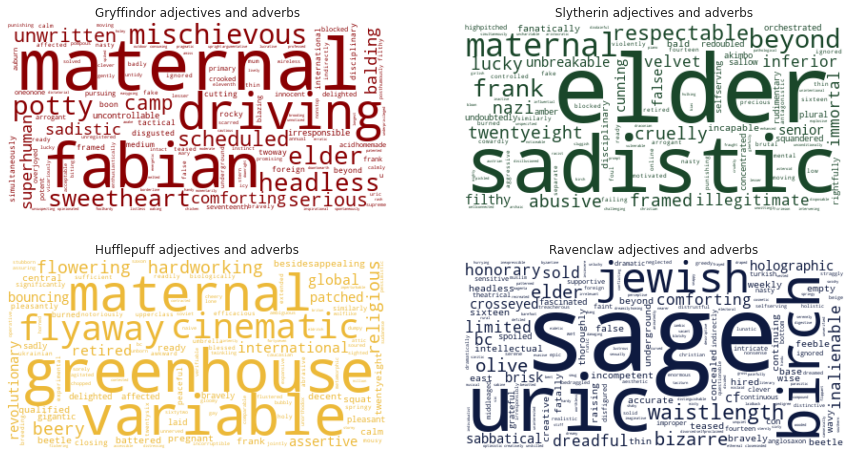

In [273]:
# Plot wordclouds all words

fig, axs = plt.subplots(2, 2,  figsize=(15, 8), sharey=True)

axs[0][0].imshow(wordcloud_dict_JJRB["Gryffindor"], interpolation='bilinear')
axs[0][0].axis("off")
axs[0][0].set_title("Gryffindor adjectives and adverbs")

axs[0][1].imshow(wordcloud_dict_JJRB["Slytherin"], interpolation='bilinear')
axs[0][1].axis("off")
axs[0][1].set_title("Slytherin adjectives and adverbs")

axs[1][0].imshow(wordcloud_dict_JJRB["Hufflepuff"], interpolation='bilinear')
axs[1][0].axis("off")
axs[1][0].set_title("Hufflepuff adjectives and adverbs")

axs[1][1].imshow(wordcloud_dict_JJRB["Ravenclaw"], interpolation='bilinear')
axs[1][1].axis("off")
axs[1][1].set_title("Ravenclaw adjectives and adverbs")

plt.savefig("house_adjAdv_wc.png")

plt.show()

When examining the wordclouds above, the house traits are not clear. 
For Gryffindor, one can see words like driving, maternal and fabian, 
properly refering to the character Fabian Weasley and not the adjective meaning "relating to or characteristic of the Fabian movement". 
None of these words are similar to the meaning of the word brave. 
It is the same case, that the house trait for both Slytherin and Hufflepuff can neither be observed.
For Ravenclaw the main word is sage which has the same semantics as wise. 
But upon further analysis it becomes clear that the words is due to the Ravenclaw character Sage Bragnam. 
Unfortunately, the given method could not tell names and the likes from adjectives spelled the same way.
Therefore the name sage has been mistaken for the adjective sage.

#### House representation in the books

So far, all analyses have been based on the wikipedia page.
However, it was interesting to examine the usage of houses more in the context of the actual material; the books.
The idea is to create a timeline of when houses are used throughout the books.
This can be illustrated by using a dispersion plot. 
In this case, the dispersion plot is based on the [nltk book](https://www.nltk.org/book/ch01.html) where the word offset is used as the time frame on the x-axis 
and the wanted words - in this case the houses - on the y axis. 
For this part focus lies on the characters that actually have a house and thus the "Unknown House" is not used.

Given the list of words that should be looked for, the dispersion plot shows occurences as points based on the word offset.
At first a simple dispersion plot is created, that illustrates when direct mentions of houses are made:

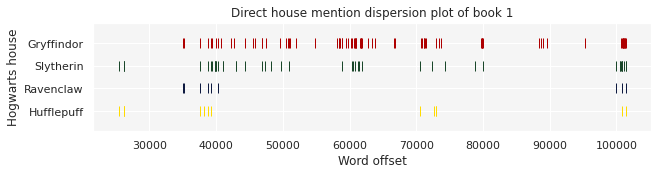

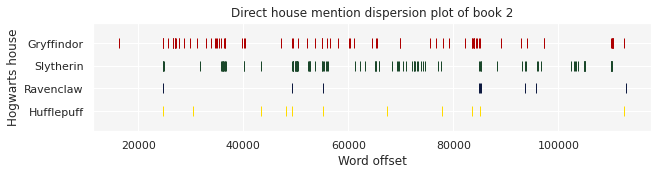

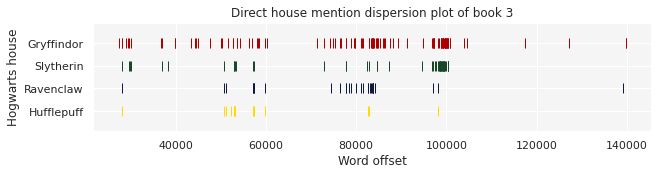

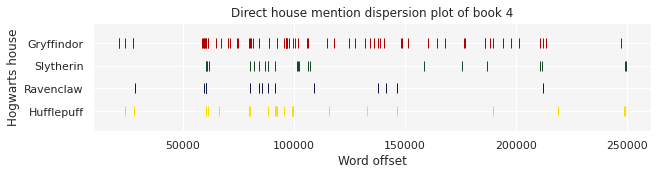

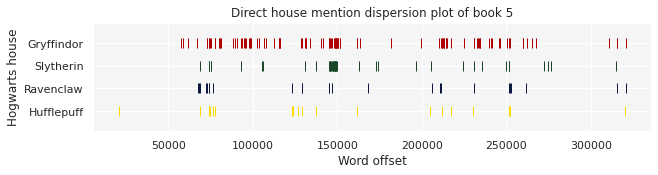

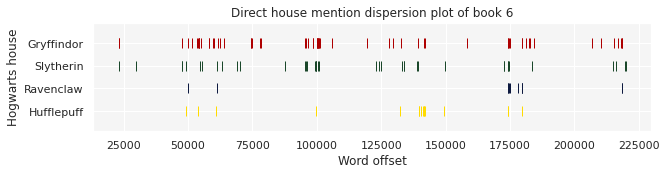

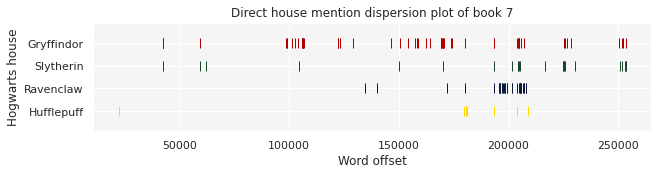

In [274]:
# Iterate through each book
for i in range(len(books)):
    # Get book text
    book_text = open("Book_text_files/book" + str(i+1) + ".txt", "r").read()

    gryff_disp = []
    slyth_disp = []
    rav_disp = []
    huff_disp = []

    # Look through each word of the text
    # and look for house, if found add as a point
    # where y is house and x is word offset 

    for j, word in enumerate(word_tokenize(book_text)):
        if (word == 'Gryffindor'):
            gryff_disp.append(('Gryffindor',j))
        elif (word == 'Slytherin'):
            slyth_disp.append(('Slytherin',j))
        elif (word == 'Ravenclaw'):
            rav_disp.append(('Ravenclaw',j))
        elif (word == 'Hufflepuff'):
            huff_disp.append(('Hufflepuff', j))


    # Get two lists from result
    gryff_y, gryff_x = zip(*gryff_disp)
    slyth_y, slyth_x = zip(*slyth_disp)
    rav_y, rav_x = zip(*rav_disp)
    huff_y, huff_x = zip(*huff_disp)
    
    # Make plots 
    markerwidth = 1
    marker_size = 10

    plt.figure(figsize=(10,2))
    plt.plot(list(huff_x), list(huff_y), '|', color="#FFDB00", markeredgewidth= markerwidth, markersize=marker_size)
    plt.plot(list(rav_x), list(rav_y), '|', color="#0E1A40", markeredgewidth= markerwidth, markersize=marker_size)
    plt.plot(list(slyth_x), list(slyth_y), '|', color="#1A472A", markeredgewidth= markerwidth, markersize=marker_size)
    plt.plot(list(gryff_x), list(gryff_y), '|', color="#AE0001", markeredgewidth= markerwidth, markersize=marker_size)
    plt.title("Direct house mention dispersion plot of book " + str(i+1))
    plt.xlabel("Word offset")
    plt.ylabel("Hogwarts house")
    ax = plt.gca()
    ax.set_facecolor('#f5f5f5')
    ax.margins(y=0.3)
    fig = plt.gcf()
    plt.subplots_adjust(wspace=2, hspace=2)
    plt.savefig("HouseDispersionPlotsSimple/dispersion_plot_" + str(i+1) + ".png")
    plt.show()  

As one can see from the dispersion plots above, the Gryffindor house is the most well-represented house throughout the books. 
Not suprising since this is the house of the main characters.
Other interesting things can also be seen however. 
An example is in the seventh book where there is a cluster of Ravenclaw mentions near the end.
The Ravenclaw house has a very important part to play during the last part of the last book, so it makes a lot of sense to see such a cluster at that point in the story.
It is also interesting to see how much Slytherin is used in the second book. In this book there is a lot of mentions of the 'Heir of Slytherin' so once more this makes sense.
It is a bit surprising to see that there is not that much of a difference between representation of each house from to book to book.
However, it seems as if there is a small change in when they are used. 
For the first books, it is interesting to see that there are places where all houses are mentioned at the same relative time.
This is perhaps some sort of general meeting of houses or the like. 
However, as the books go on it seems as if house mentions becomes more independent. 
This also makes perfect sense since Harry gets more friends of other houses throughout the book series and houses have a unique part to play.


The making of a dispersion plot of direct house mentions did not satisfy the need to examine the house representation. 
An expansion to this analysis was thus considered where instead of looking for simple mentions of each house,
mentions of characters and their respective house are also considered. 

However by only looking at the books, it is not clear which house a character is connected to.
Therefore, a mixture of our network and the book is used.
The idea is to iterate through all characters in the network. 
If the character name is found in the text, the name is replaced with their respective house attribute.
Therefore to create this kind of dispersion plot, the text firstly needs to be looked at and replace character names:

In [275]:
# Go through each book
house_book_text = dict()

for i in range(len(books)):
    # Get book text
    book_text = open("Book_text_files/book" + str(i+1) + ".txt", "r")
    
    # Set text to book text
    house_book_text[i] = book_text.read()

    # Go through each node (name) in graph
    for character in Gc.nodes(data=True):
        name = character[0]

        house = character[1]['house'].replace(" ", "_")
        # Find full name of character in text and replace with house
        house_book_text[i] = house_book_text[i].replace(name, house)

        # Find first name of character in text and replace with house
        full_name = name.split()
        first_name = full_name[0]
        house_book_text[i] = house_book_text[i].replace(first_name, house)

        # Find last name of character in text and replace with house
        if (len(full_name) > 1):
            last_name = full_name[-1]
            try:
                house_book_text[i] = house_book_text[i].replace(last_name, house)
            except:
                pass


Variables with the changed texts have thus been created, and a dispersion plot for each book can be made:

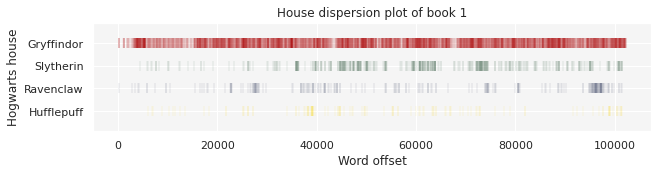

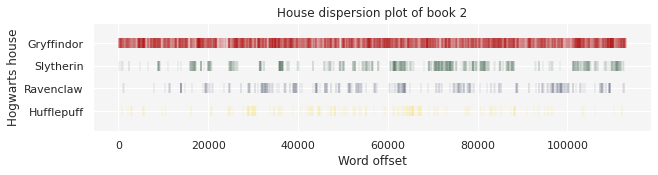

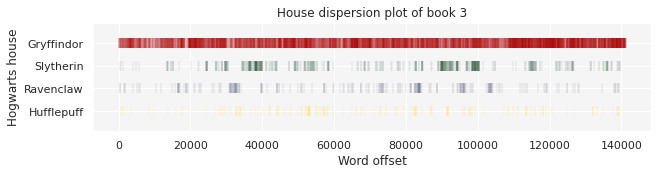

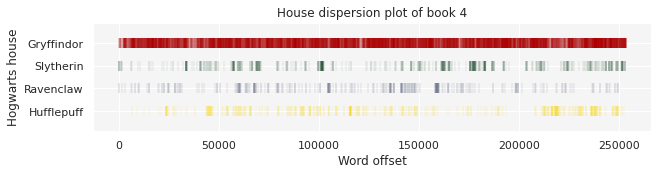

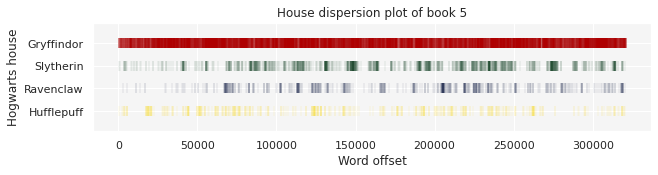

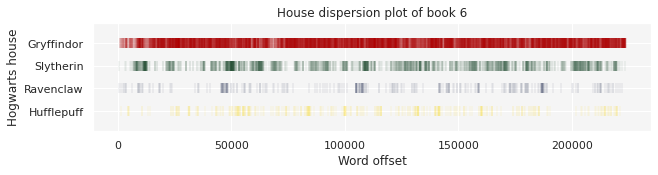

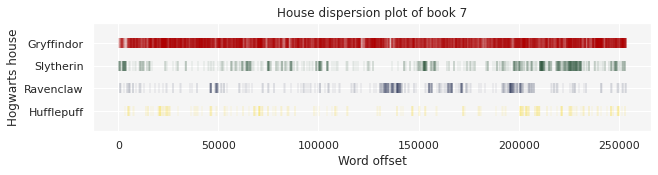

In [276]:
# Iterate through each book
for i in range(len(books)):
    gryff_disp = []
    slyth_disp = []
    rav_disp = []
    huff_disp = []

    # Look through each word of the text
    # and look for house, if found add as a point
    # where y is house and x is word offset 
    for j, word in enumerate(word_tokenize(house_book_text[i])):
        if (word == 'Gryffindor'):

            gryff_disp.append(('Gryffindor',j))
        elif (word == 'Slytherin'):
            slyth_disp.append(('Slytherin',j))
        elif (word == 'Ravenclaw'):
            rav_disp.append(('Ravenclaw',j))
        elif (word == 'Hufflepuff'):
            huff_disp.append(('Hufflepuff', j))


    # Get two lists from result
    gryff_y, gryff_x = zip(*gryff_disp)
    slyth_y, slyth_x = zip(*slyth_disp)
    rav_y, rav_x = zip(*rav_disp)
    huff_y, huff_x = zip(*huff_disp)
    
    # Make plots 
    markerwidth = 0.1
    marker_size = 10

    plt.figure(figsize=(10,2))
    plt.plot(list(huff_x), list(huff_y), '|', color="#FFDB00", markeredgewidth= markerwidth, markersize=marker_size)
    plt.plot(list(rav_x), list(rav_y), '|', color="#0E1A40", markeredgewidth= markerwidth, markersize=marker_size)
    plt.plot(list(slyth_x), list(slyth_y), '|', color="#1A472A", markeredgewidth= markerwidth, markersize=marker_size)
    plt.plot(list(gryff_x), list(gryff_y), '|', color="#AE0001", markeredgewidth= markerwidth, markersize=marker_size)
    plt.title("House dispersion plot of book " + str(i+1))
    plt.xlabel("Word offset")
    plt.ylabel("Hogwarts house")
    ax = plt.gca()
    ax.set_facecolor('#f5f5f5')
    ax.margins(y=0.3)
    fig = plt.gcf()
    plt.subplots_adjust(wspace=2, hspace=2)
    plt.savefig("HouseDispersionPlotsFull/dispersion_plot_" + str(i+1) + ".png")
    plt.show() 

Unsurprisingly, Gryffindor is the most represented house once more and is used almost through out all books.
The main characters are from this house resulting in the many mentions in the books. 
It is interesting to see that other houses are actually well-represented through-out the books.
In the previous method where only direct house mentions where used this was not quite clear where Hufflepuff and Ravenclaw was not mentioned a lot.
Certainly, the Hufflepuff house is the less used house. But the house is represented a lot in e.g. the fourth books. 
This is most likely due to the Hufflepuff character Cedric Diggory being a main character and plot point in that particular book.
The rivalry between the Griffyndor house and Slytherin house is also fairly constant through out the books, where Slythin is the second most represented book generally.

#### Sentiment analysis

There is an overall idea that the Slytherin house is more sinister and evil than the other houses.
It is therefore wanted to see if the language used to describe each house are more negative or positive. 
This is thus done to see if there is a noticeable difference between the mood of the houses.

To investiage this, sentiment analysis will be performed of the concatenated house files with all their characters' text files. 
This sentiment analysis could possibly shred some light on if the characters from different houses are described in a good or bad way.
To perform a sentiment analysis, a way of telling if a word is happy or sad is needed. 
A table has been gathered containing 10000 words with a corresponding "happiness average" which will rank the words according to mood. 
This table is based on the following [paper](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0026752).
The average happiness for each concatenated house file is then checked.
The sentiments and their corresponding values are stored in the "LabMT.txt" file:


In [277]:
# Load LabMT and make it into pandas table
labmt = pd.read_csv("LabMT.txt", sep="\t")
labmt

,word,happiness_rank,happiness_average,happiness_standard_deviation,twitter_rank,google_rank,nyt_rank,lyrics_rank
0,laughter,1,8.50,0.9313,3600,--,--,1728
1,happiness,2,8.44,0.9723,1853,2458,--,1230
2,love,3,8.42,1.1082,25,317,328,23
3,happy,4,8.30,0.9949,65,1372,1313,375
4,laughed,5,8.26,1.1572,3334,3542,--,2332
...,...,...,...,...,...,...,...,...
10217,murder,10218,1.48,1.0150,2762,3110,1541,1059
10218,terrorism,10219,1.48,0.9089,--,--,3192,--
10219,rape,10220,1.44,0.7866,3133,--,4115,2977
10220,suicide,10221,1.30,0.8391,2124,4707,3319,2107


A function is then defined which will calculate the sentiments based on a tokens frequency list. 
This function will for each word in the frequency list check if the word is present in the LabMT table. 
If it is, then the "happiness_average" will be multiplied with the number of occurances of that word.
If the word does not appear, it will be given a "happiness_average" of 0. 
Then the sentiment is calculated by checking how many words matched in the LabMT table and dividing the accumulated "happiness_average":

In [278]:
# Function that calculates sentiment 
# given a list of tokens that has been modified (lower case etc.)
def calc_sentiment(tokens_freq):
    # Sum of all happiness_average
    sentiment = 0
    # Token count, used to find the average sentiment of 
    # tokens found in the labmt
    words_found = 0
    
    # Iterate through given tokens and multiply its happiness with the amount 
    # of times it appears
    for (token, count) in list(tokens_freq.items()):
        try:
            happiness = labmt.loc[labmt['word'] == token]['happiness_average'].values[0] * count
            words_found  += count
        except:
            happiness = 0
        
        # Add found happiness to sentiment
        sentiment += happiness
    
    # Add average of happiness average of all found tokens, returns sentiment of the page
    return sentiment / words_found

A frequency list of tokens for each house based on the corresponding house text files are created:

In [279]:
houses_freq = dict()
houses = ["Gryffindor", "Hufflepuff", "Ravenclaw", "Slytherin", "Unknown_House"]
# Iterate through each book, find tokens (i.e. words) and create frequency lists
for i in houses:
    house_location = "House_text_files/" + i + ".txt"
    file_house = open(house_location, "r")
    text = file_house.read()
    file_house.close()
    tokens = word_tokenize(text)

    # lower case tokens
    words = [w.lower() for w in tokens]
    # remove punctuations
    words = [w for w in words if len(re.sub(r'[^\w\s]','',w)) > 1]
    # Lemmatize
    #words = [wnl.lemmatize(w) for w in words]

    print("Number of tokens for house " + i +":", len(words))

    freq_dist = nltk.FreqDist(words)
    houses_freq[i] = freq_dist 

Number of tokens for house Gryffindor: 536399
Number of tokens for house Hufflepuff: 117703
Number of tokens for house Ravenclaw: 128265
Number of tokens for house Slytherin: 297684
Number of tokens for house Unknown_House: 126566


With the frequency lists gathered gathered, the sentiment for each house can be calculated:

In [280]:
house_sentiments = dict()

for house in houses_freq:
    house_sentiments[house] = calc_sentiment(houses_freq[house])

for (b, s) in house_sentiments.items():
    print(b, "has a sentiment of", s)

Gryffindor has a sentiment of 5.336681034054678
Hufflepuff has a sentiment of 5.371361824944446
Ravenclaw has a sentiment of 5.368175822953736
Slytherin has a sentiment of 5.324423776865009
Unknown_House has a sentiment of 5.351436538007479


There is only a small difference between the sentiments of each house,
where Hufflepuff and Ravenclaw have the highest sentiment scores and Gryffindor and Slytherin has the lowest. 
Since there is such a small difference between the sentiments, it cannot be concluded if there is an actual difference in how the houses and their characters are described. 
A reason for there being no noticeable difference is that we do the sentiment analysis over some very long texts and thus if there is a small portion of characters with a sad or dark wikipedia page then that might get cancelled out with characters with a happier or more neutral character page.
In addition, encyclopedia pages tend to be neutral.

### Book Analysis

The following sections describe the analysis steps where the contents of the books are the focus. These analyses thus functions as an extention to the analyses of the houses:

#### TF-IDF and wordclouds

The same procedure of creating wordclouds and calculating weights for terms as described earlier is used for the book wordclouds. 

Therefore, the used TF-IDF is:

$\text{TF-IDF} = 0.5 + 0.5 \cdot \frac{f_{t,d}}{max_{\{t' \in d\}} f_{t',d}} \cdot \log{\frac{N}{n_t}},$

since once more normalizing term frequencies showed as an advantage due to the different lenghts of each book.

The TF-IDFs for each token for each book is then used as 
an indicator of importance in the created wordclouds shown through sizes.
To create the wordcloud, the TF-IDF for each token needs to be calculated for each book.
A string is then created where each token is repeated based on the found TF-IDF:

In [281]:
wordcloud_strings_book = dict()

N = len(books_freq)

# Iterate through each book
for i in range(1,N+1):
    # Create wordcloud string for book
    wordcloud_strings_book[i] = ""

    max_count = max(list(books_freq[i].values()))

    # Go through each word and their frequency
    for (word, count) in list(books_freq[i].items()):

            # Calc TF
            tf = (0.5 + 0.5 * (count / max_count))
            # Calc IDF
            nt = countInDict(word, books_freq)
            idf = np.log(N/nt)

            # Calc TF-IDF
            tf_idf = tf * idf

            # Find count of words based on tf-idf as weight
            wc_count = round(count * tf_idf)
        
            # Add the word to the string based on count
            word_string = (word + " ") * wc_count
            wordcloud_strings_book[i] += word_string

The wordcloud strings for each book have thus been created. A wordcloud for each book can then be generated and shown:

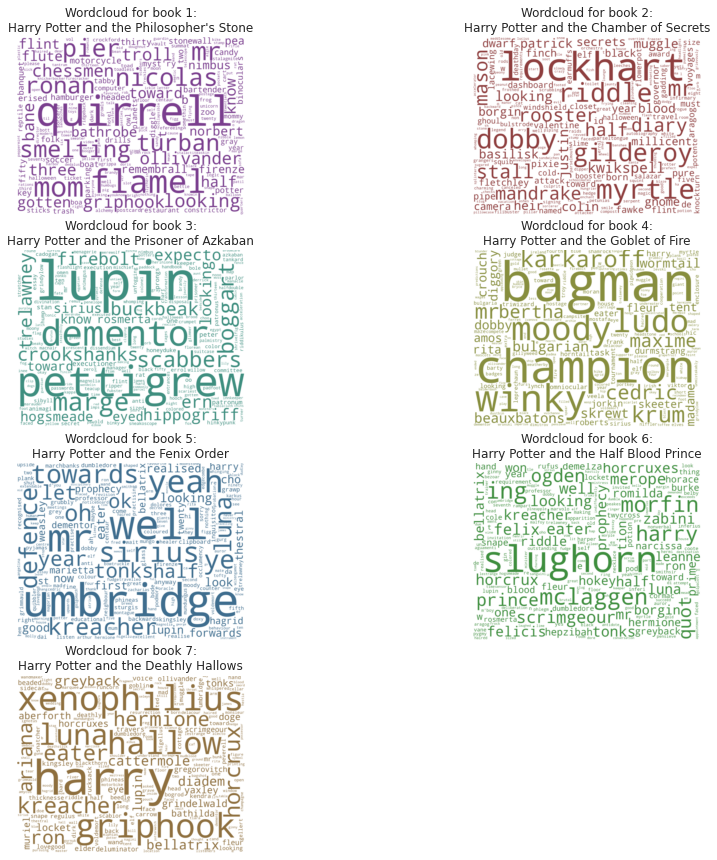

In [282]:
# Look-up for book titles
books = ["Harry Potter and the Philosopher's Stone", "Harry Potter and the Chamber of Secrets", "Harry Potter and the Prisoner of Azkaban", "Harry Potter and the Goblet of Fire", "Harry Potter and the Fenix Order", "Harry Potter and the Half Blood Prince", "Harry Potter and the Deathly Hallows"]

# Define plot axis
fig, axs = plt.subplots(4, 2,  figsize=(15, 15), sharey=True)
fig.delaxes(axs[3,1])

# Variables used for wordcloud color determination
max_font_size = 1400
color_picker = 0
hues = [285, 360, 169, 65, 205, 120, 37]

# Wordcloud color function, changes luminance based on word count
# and hue based on book
def color_func(word, font_size, position,orientation,random_state=None, **kwargs):
    lum = 100 * (font_size / max_font_size)
    lum = max(lum, 40)
    lum = min(lum, 80)
    hue  = hues[color_picker]
    return "hsl(%d, 39%%, %d%%)" % (hue, lum)

# Iterate through all books and create a wordcloud for each
row = 0
for i in range(1,8):
    wc = WordCloud(
            stopwords= ['wa', "n't", 's', 'said', 'd', 'c', 'p'] + list(STOPWORDS),
            background_color='white',
            width=1800,
            height=1400,
            collocations = False,
            color_func = color_func
        ).generate(wordcloud_strings_book[i])

    col = (i-1) % 2
    axs[row, col].imshow(wc, interpolation='bilinear')
    axs[row, col].axis("off")

    book_title = books[i-1]
    axs[row, col].set_title("Wordcloud for book " + str(i) +":\n" + book_title) 

    if i % 2 == 0:
        row += 1
    
    color_picker += 1

plt.savefig("books_wc.png")
plt.show()

Using the specfied TF-IDF, the distinct words for each book can be seen in the wordcloud. 
It is interesting to see that major plot points or characters in each book are visible (e.g. horcrux in the last book, expecto patronum in the third book).
The first book shows characters like Quirrell (who wears a turban that also appears) and Nicolas Flamel who are both major characters in that specific book.
In general, the wordclouds focuses on names that are most relevant for that particular book. 
This includes Gilderoy Lockhart for the second book, Lupin and Pettigrew for the third book,
Ludo Bagman, Krum and Cedric for the fourth book, Sirius and Umbridge for the fifth book, Slughorn and McLaggen for the sixth book.
Finally, the last book contains Xenophilius and Griphook. 
It is very interesting to see how much of an importance Harry has in the last book compared to the other books. 
In the last book Harry is on the run and there seem to generally be a focus on his past, present and future, so it makes sense that he is highlighted.

All in all, it is easy from each wordcloud to see which book it described - even without the titles.

Individual wordclouds for each book are saved for more flexibility and usage for the webpage:

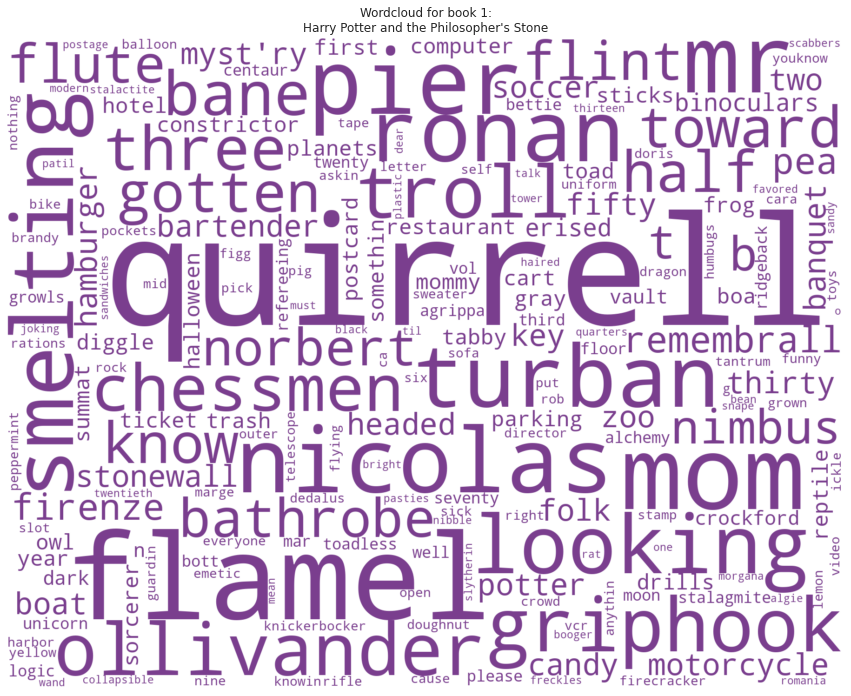

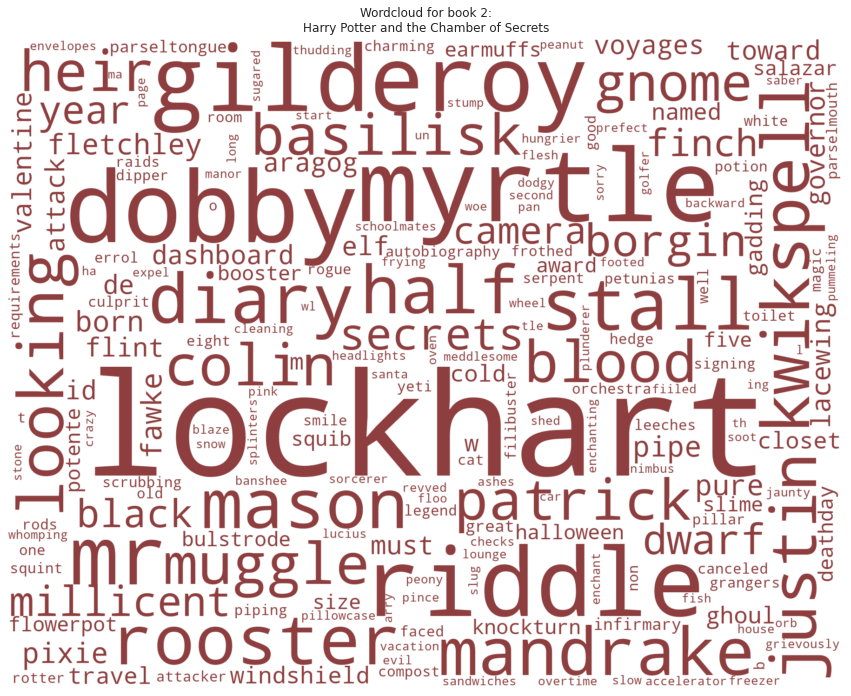

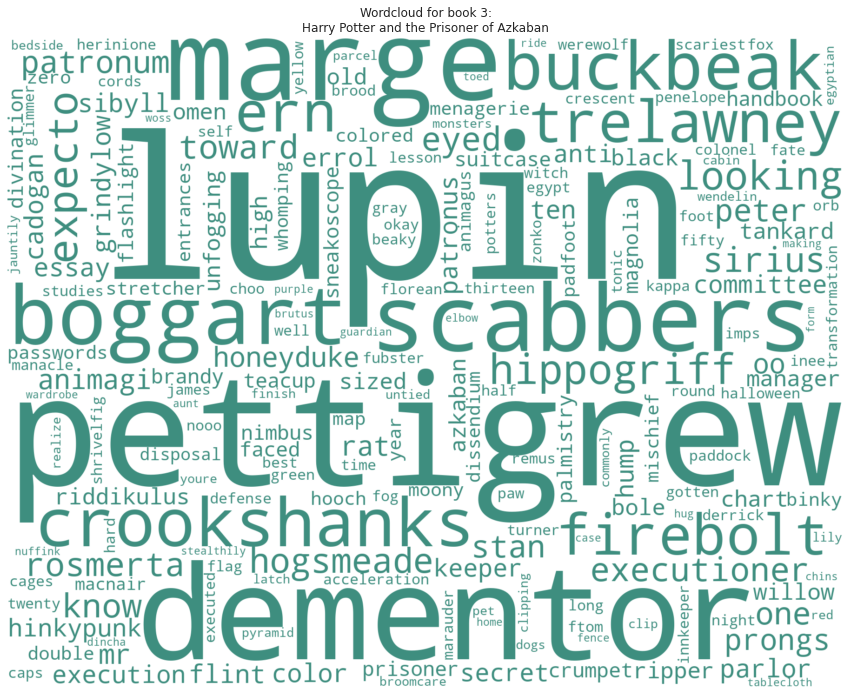

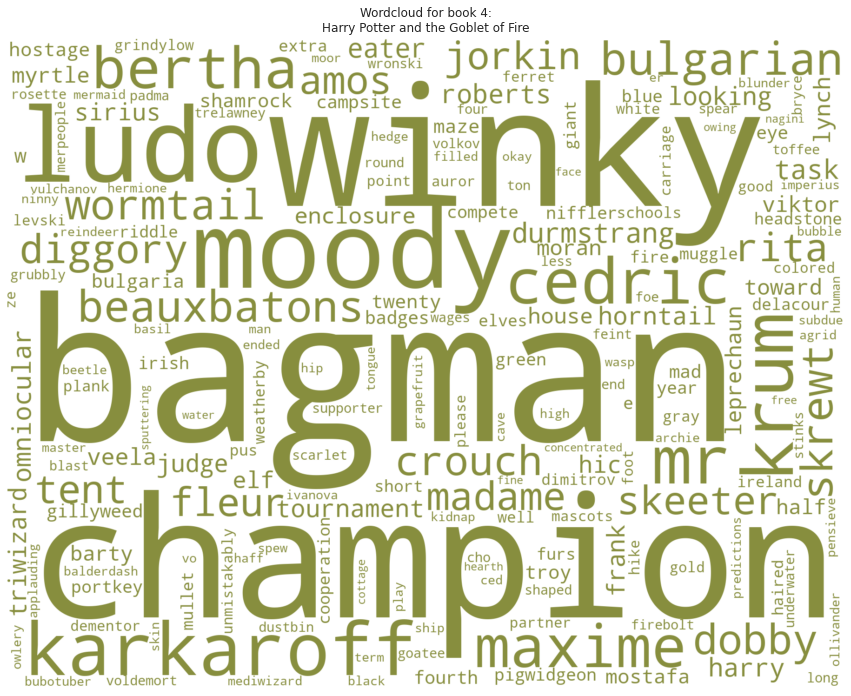

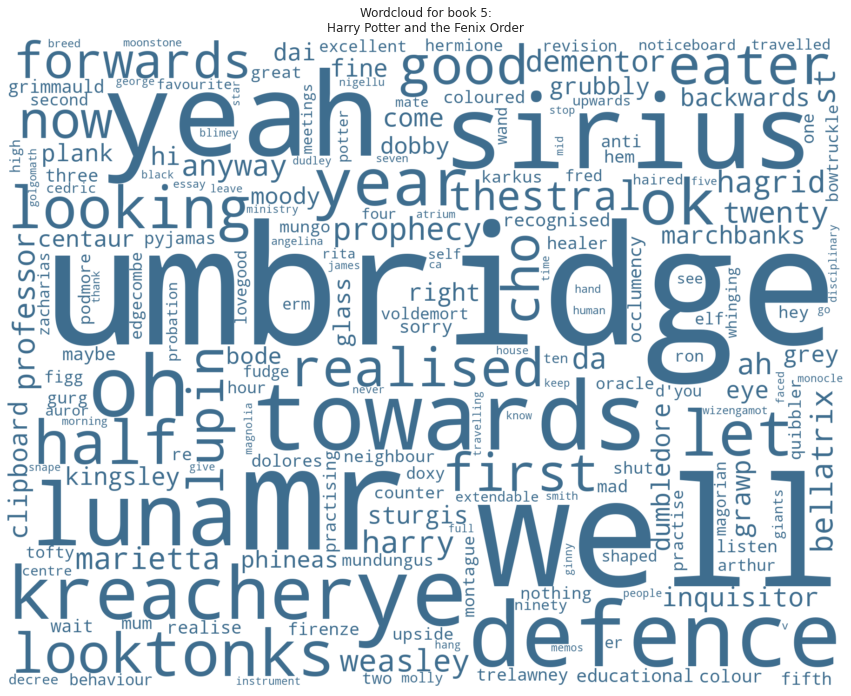

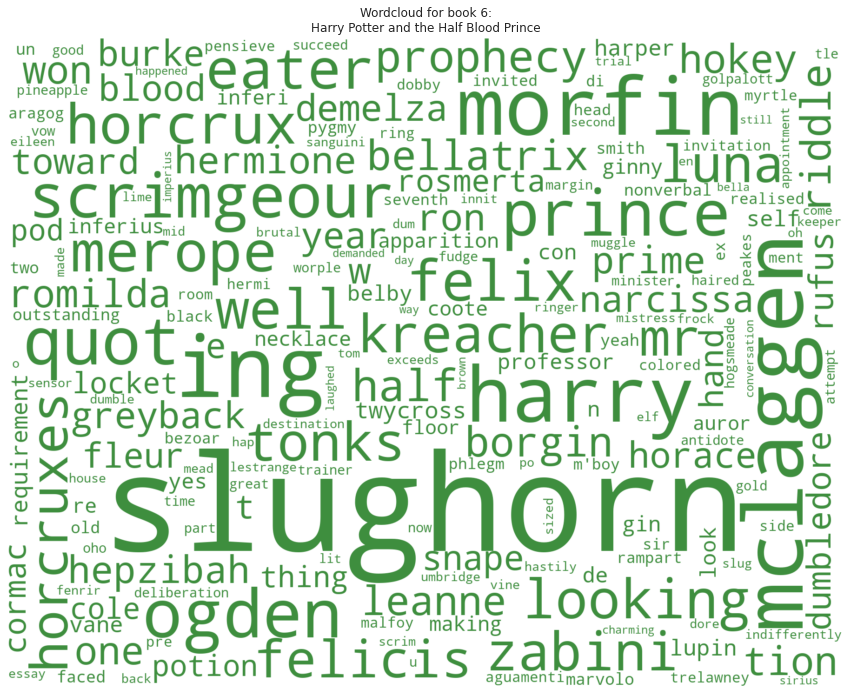

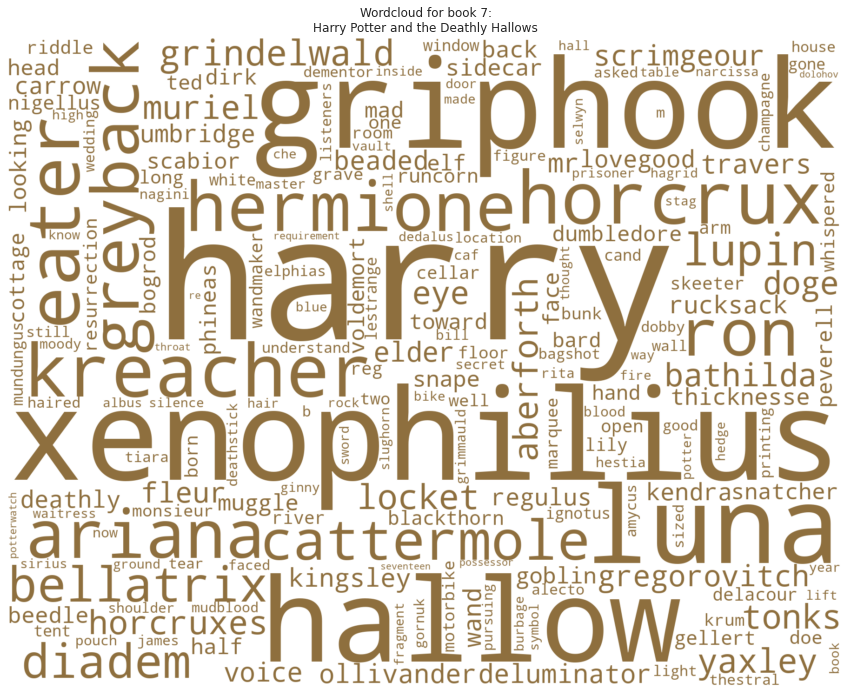

In [283]:
# Create individual wordclouds
color_picker = 0
for i in range(1,8):
    plt.figure(figsize=(15,15))

    wc = WordCloud(
            stopwords= ['wa', "n't", 's', 'said', 'd', 'c', 'p'] + list(STOPWORDS),
            background_color='white',
            width=1800,
            height=1400,
            collocations = False,
            color_func = color_func
        ).generate(wordcloud_strings_book[i])

    book_title = books[i-1]
    plt.title("Wordcloud for book " + str(i) +":\n" + book_title) 
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')

    color_picker += 1

    file_name_book_wc = "BookWCPlots/books_wc_" + str(i) + ".png"
    plt.savefig(file_name_book_wc)

#### Sentiment change

Initially, the average sentiment was analysed for each book:

In [284]:
book_sentiments = dict()

for i in range(len(books)):
    book_sentiments[i+1] = calc_sentiment(books_freq[i+1])

for (b, s) in book_sentiments.items():
    print("Book", b, "has a sentiment of", s)

Book 1 has a sentiment of 5.3472077127741
Book 2 has a sentiment of 5.327441097609667
Book 3 has a sentiment of 5.3274408678845795
Book 4 has a sentiment of 5.337844628120036
Book 5 has a sentiment of 5.327684116103605
Book 6 has a sentiment of 5.328385115503007
Book 7 has a sentiment of 5.2963954258275034


As seen, the result does not say that much. The initial hope was that one would be able to see that the books became more darker.
But as it is with large texts, the sentiment certainly approaches a netural language.
This short analysis of the sentiment was not made in vain however.
As stated, the data collected for the books were in a convenient csv-format seperated into chapters. 
One could therefore find the sentiment for each chapter and compare it with the sentiment for the given book.
The idea is to create a timeline of the events in each book based only on the sentiment. 
It would make sense that chapters with a happy tone will show a higher sentiment while
chapter where everything is at stake or the enemies almost wins will show a low sentiment.


Therefore, the sentiment for each chapter needs to be calculated. 
The relative sentiment is then found by subtracting the book sentiment from the chapter sentiment.
The found relative sentiment value is added to the data frame for easy access:


In [285]:
# Go through each chapter and calculate its sentiment
for index, row in book_df.iterrows():
    text = row['Text']
    tokens = word_tokenize(text)

    # lower case tokens
    words = [w.lower() for w in tokens]
    # remove punctuations
    words = [w for w in words if len(re.sub(r'[^\w\s]','',w)) > 1]

    freq_dist = nltk.FreqDist(words)
    chapter_sentiment = calc_sentiment(freq_dist)
    book_df.loc[index, 'Sentiment'] = chapter_sentiment

    book_df.loc[index, 'Relative Book Sentiment'] = chapter_sentiment - book_sentiments[row['Book']]

Now every chapter contains a relative sentiment based on its own sentiment and the sentiment for the book. 
The change of sentiment can then be plotted like a timeline:

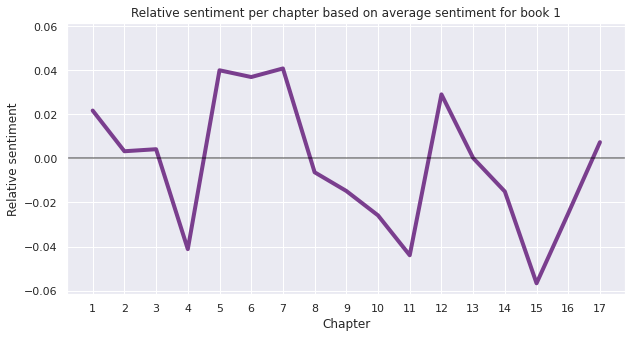

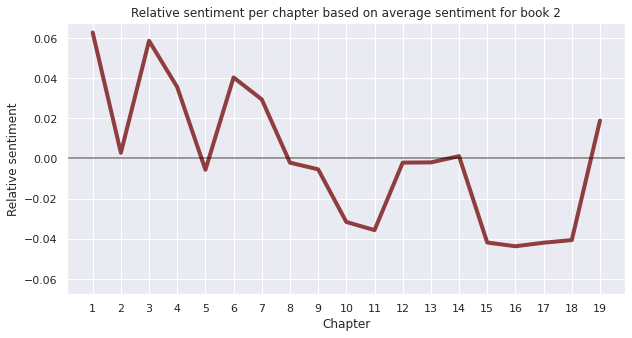

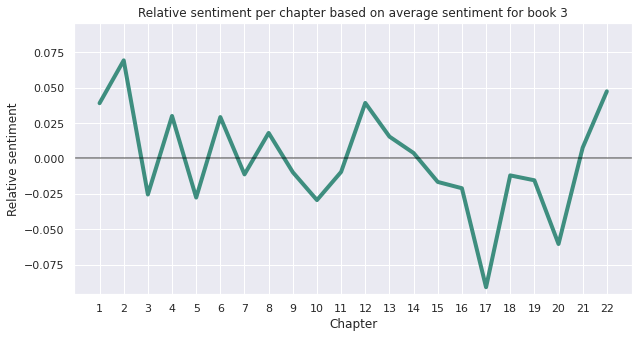

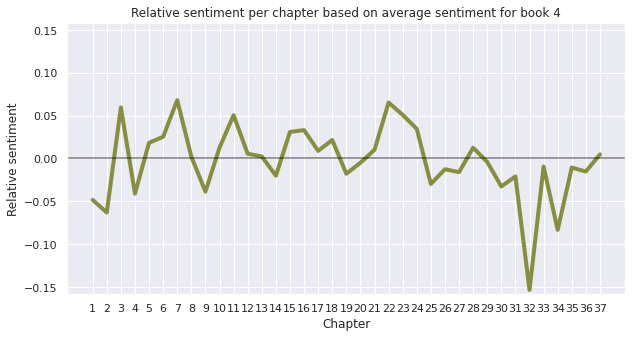

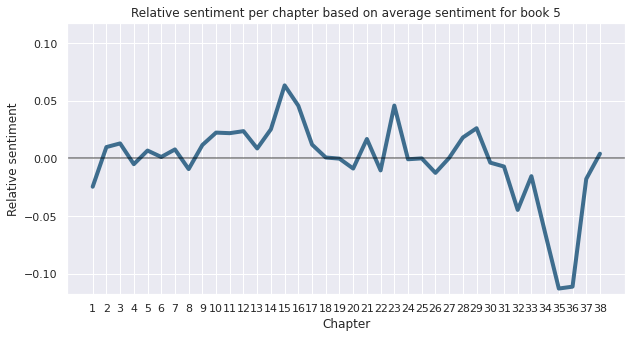

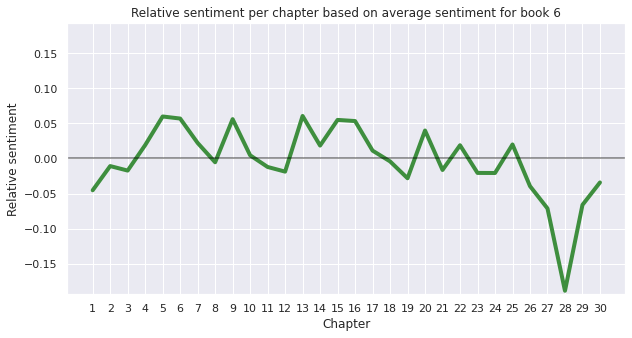

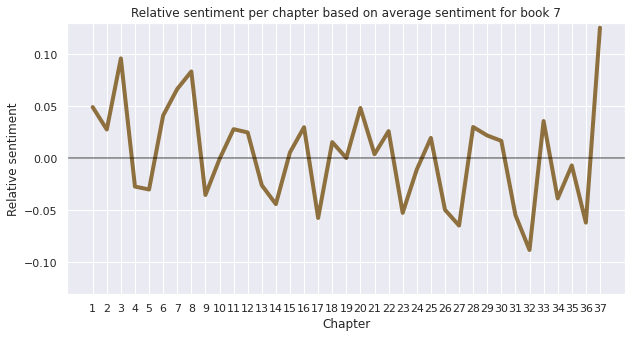

In [286]:
plot_colors = ["#7a3e8e","#8e3e3e","#3e8e7f","#878e3e",
               "#3e6d8e","#3e8e3e","#8e6f3e"
              ]                

# hues = [285, 360, 169, 65, 205, 120, 37]
# saturation 39

# Iterate through each book
for i in range(len(books)):
    chapter_sentiments = []
    chapter = []

    # Go through each row of data frame
    for index, row in book_df.iterrows():
        if row['Book'] != (i+1):
            continue
        
        # For the given book add relative book sentiment and chapter
        # to lists used for plot
        chapter_sentiments.append(row['Relative Book Sentiment'])
        chapter.append(row['Chapter'])

    small_s = abs(min(chapter_sentiments))
    large_s =max(chapter_sentiments)

    yrange=max(small_s, large_s) + 0.005

    # For each book plot relative sentiment change
    plt.figure(figsize=(10,5),)

    plt.plot(chapter, chapter_sentiments, plot_colors[i], linestyle="-", linewidth=4)
    plt.title("Relative sentiment per chapter based on average sentiment for book " + str(i+1) )
    plt.axhline(0.0, color='black', alpha=0.5)
    plt.ylim(ymin=-yrange, ymax=yrange)
    plt.xlabel("Chapter")
    plt.xticks(chapter)
    plt.ylabel("Relative sentiment")
    plt.savefig("RelativeSentimentPlots/" + "plot_for_book" + str(i+1) + ".png")
    plt.show()

As one can see, for each book the finale where Harry has to face his foe and the stakes are high, the sentiments are low, while the books themselves are fairly postive in the beginning and middle.

It is also clear that the series truly ends at a high point as shown in the sentiment spike at the last chapter (37) of the last book.
However, not all books ends on a high note. This is clear when looking at book 6 where the relative sentiment is actually lower than the average sentiment.
This totally makes sense when compared to the actual content of the book (the actual content is not described due to spoilers).

#### Spell dispersion plot

Since spells and magic is a big part of the Harry Potter universe, the usages of spells and their changes are examined throughout the books.

The method for this will be the same as when the dispersion plots for the house representation was created. 
But first, it is needed to know what spells there are in the Harry Potter universe. 
Luckily, the Harry Potter fandom wiki has a category with all [spells in the stories](https://harrypotter.fandom.com/wiki/Category:Spells).
API calls are thus used to extract all of the spells and check the books for their usage and then finally create a plot like the dispersion plots above.

When using the API, one gets a spell ID, which can be concatenated into a list of all spell IDs:

In [287]:
# Get list of spells
spells = []

base_articles_url = "https://harrypotter.fandom.com/api/v1/Articles/List?category="
category = "Spells"
expand = "expand=1"
limit="limit=10000"

# Query to get the spells
# link format: https://harrypotter.fandom.com/api/v1/Articles/List?category=Spells&expand=1
# corresponding page: https://harrypotter.fandom.com/wiki/Category:Spells
# Result is json containing houses
query_spells_full = "{}{}&{}&{}".format(base_articles_url, category, expand, limit)
print(query_spells_full)
link_spells_full = urllib.request.urlopen(query_spells_full)
data_spells_full = link_spells_full.read()
json_spells_full = json.loads(data_spells_full.decode('utf-8'))

# Add each found house  to list of houses
for j in json_spells_full['items']:
    spells.append(j['id'])

print(spells)
print(len(spells))

https://harrypotter.fandom.com/api/v1/Articles/List?category=Spells&expand=1&limit=10000
[54710, 197015, 5471, 8513, 30185, 217113, 211598, 164554, 5184, 4508, 58849, 195780, 56126, 43615, 151848, 121261, 958, 5380, 5381, 15756, 152125, 151580, 4590, 746, 11169, 164548, 124517, 162127, 164551, 35790, 21650, 5472, 212360, 175210, 8547, 961, 43620, 45665, 4134, 964, 232703, 965, 43593, 159985, 15615, 44272, 192419, 226137, 116007, 960, 150499, 164461, 5470, 125881, 201319, 213097, 154815, 147747, 13617, 1025, 11245, 142042, 143787, 6898, 192756, 115986, 966, 217418, 153937, 171512, 96063, 211762, 29938, 968, 157022, 228214, 116457, 43617, 65513, 158759, 5468, 115991, 219080, 146618, 212784, 44358, 5188, 129088, 221315, 2424, 34912, 159174, 224902, 969, 208972, 145836, 213029, 146988, 162357, 118182, 973, 148954, 119659, 127933, 227280, 853, 164549, 221086, 3151, 149520, 129322, 59232, 13652, 59288, 16929, 96032, 182914, 96025, 96027, 164336, 168368, 12916, 128495, 95957, 60659, 62342, 12

Thus, a total of **663 spells** have been found. 
Using the IDs, API queries to the Harry Potter fandom will be used once more to get the name of the spells. 
However, when the characters use the spells in the books, they will often use an incantation rather than the actual name of the spell, 
so if the spell has an incantation that is fetched as well using a regex. 
Since some of the spells are in multiple words, we will also save a list where spells names have substituted whitespaces with an underscore and any uppercase characters are made lowercase:

In [288]:
base_query_spell = "https://harrypotter.fandom.com/api.php?prop=revisions&rvprop=content"
action="action=query"
pageid="pageids="
format="format=json"
spells_name = []
spells_name_temp = []
spells_name_and_incantation = []
# Iterate through caracters
for id in spells:
    # Get character node info

    spell_id = str(id)

    # Get wiki page for that character as json
    query_spell = "{}&{}{}&{}&{}".format(base_query_spell, pageid, spell_id, action, format)
    data_spell = urllib.request.urlopen(query_spell).read().decode('utf-8')
    json_spell = json.loads(data_spell)
    title = json_spell['query']['pages'][spell_id]['title']
    
    text = json_spell['query']['pages'][spell_id]['revisions'][0]
    #result = re.search('incantation=(.*?)<ref name=', str(text))
    result = re.search(r'incantation = \\\'\\\'(.*?)\\\'\\\'', str(text))

    spells_name_temp.append(title.lower())
    spells_name.append((title.replace(" ", "_").lower(),[]))

    if(result and result.group(1) != None):
        if result.group(1) != title:
            spells_name_and_incantation.append((title.lower(),result.group(1).lower()))
            
print(spells_name)
print(spells_name_temp)
print(spells_name_and_incantation)
print(len(spells_name_and_incantation))

[("aberforth_dumbledore's_goat_charm", []), ('aberto', []), ('age_line', []), ('alarte_ascendare', []), ("albus_dumbledore's_forceful_spell", []), ("albus_dumbledore's_hydro-kinetic_spell", []), ("albus_dumbledore's_unidentified_charm_on_the_mirror_of_erised", []), ('alohomora_duo', []), ('amplifying_charm', []), ('anapneo', []), ('animagus_reversal_spell', []), ('animagus_spell', []), ('annihilare', []), ('anteoculatia', []), ('anti-alohomora_charm', []), ('anti-apparition_charm', []), ('anti-cheating_spell', []), ('anti-disapparition_jinx', []), ('anti-intruder_jinx', []), ('anti-jinx', []), ('anti-theft_charm', []), ('anti-unlocking_charms', []), ("antonin_dolohov's_curse", []), ('apparition', []), ('aqua_eructo', []), ('aqua_eructo_duo', []), ('area_spell', []), ('armchair_to_human_spell', []), ('arresto_momento_duo', []), ('arrow_shooting_spell', []), ('ascendio', []), ('atmospheric_charm', []), ('avenseguim', []), ('aviatus', []), ('avifors_spell', []), ('babbling_curse', []), ('

A total of **64 spells** had an incantation. 
As to not count the same thing under to different names, all incantations are substituted  with the name of the spell.
When this is done, all the spells in the text are changed to the transformed version of the spell name with underscore and lowercase:

In [289]:
# Go through each book
spells_book_text = dict()
# Look-up for book titles
books = ["Harry Potter and the Philosopher's Stone", "Harry Potter and the Chamber of Secrets", "Harry Potter and the Prisoner of Azkaban", "Harry Potter and the Goblet of Fire", "Harry Potter and the Fenix Order", "Harry Potter and the Half Blood Prince", "Harry Potter and the Deathly Hallows"]

for i in range(len(books)):
    # Get book text
    book_text = open("Book_text_files/book" + str(i+1) + ".txt", "r")
    
    # Set text to book text
    spells_book_text[i] = book_text.read().lower()

    # Go through each spell and incantation pair
    for (s,inc) in spells_name_and_incantation:

        # Find incantation in text and replace with spell
        spell = s
        incantation = inc

        spells_book_text[i] = re.sub(r"{}".format(inc), spell, spells_book_text[i])


    for s in spells_name_temp:
        spells_book_text[i] = re.sub(r"{}".format(s), s.replace(" ", "_"), spells_book_text[i])


    

Now that the spells have the desired format in the texts each of them will be looped through and check every word if that word is a spell or not. If it is the position and which spell it is will be noted. Then whenever a book has been checked a plot will be generated from the results:

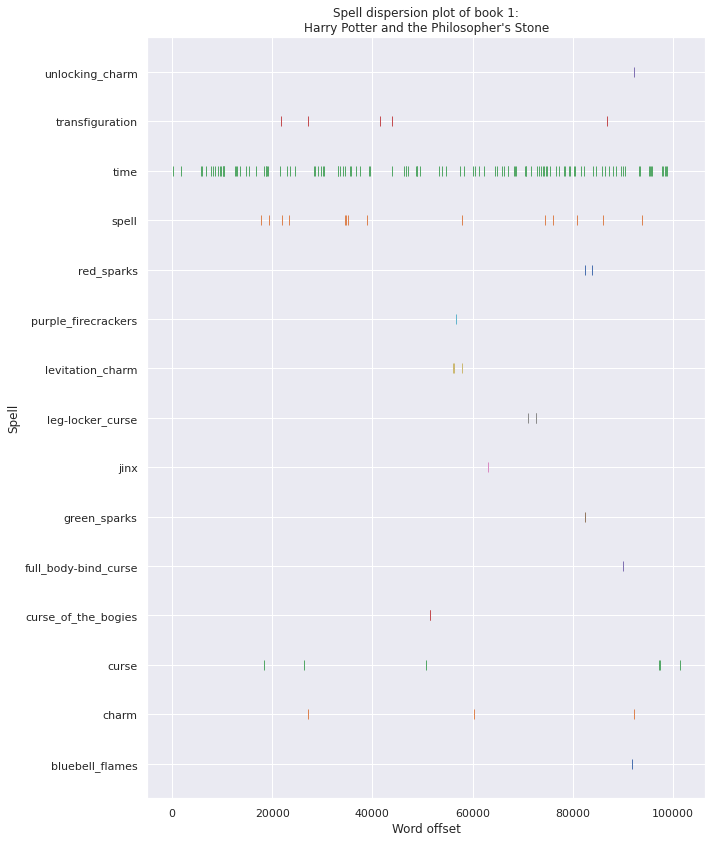

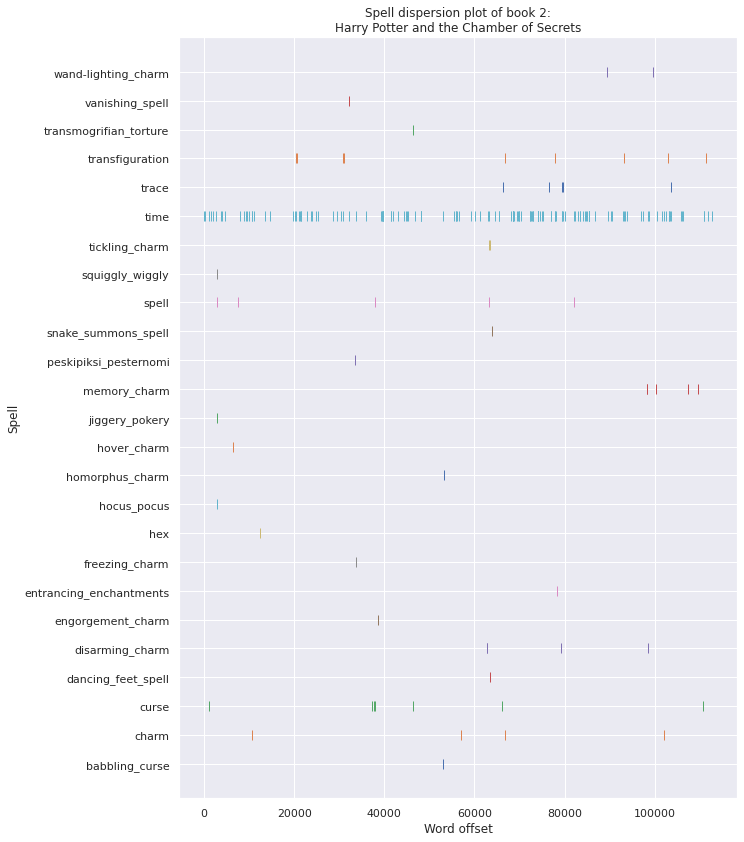

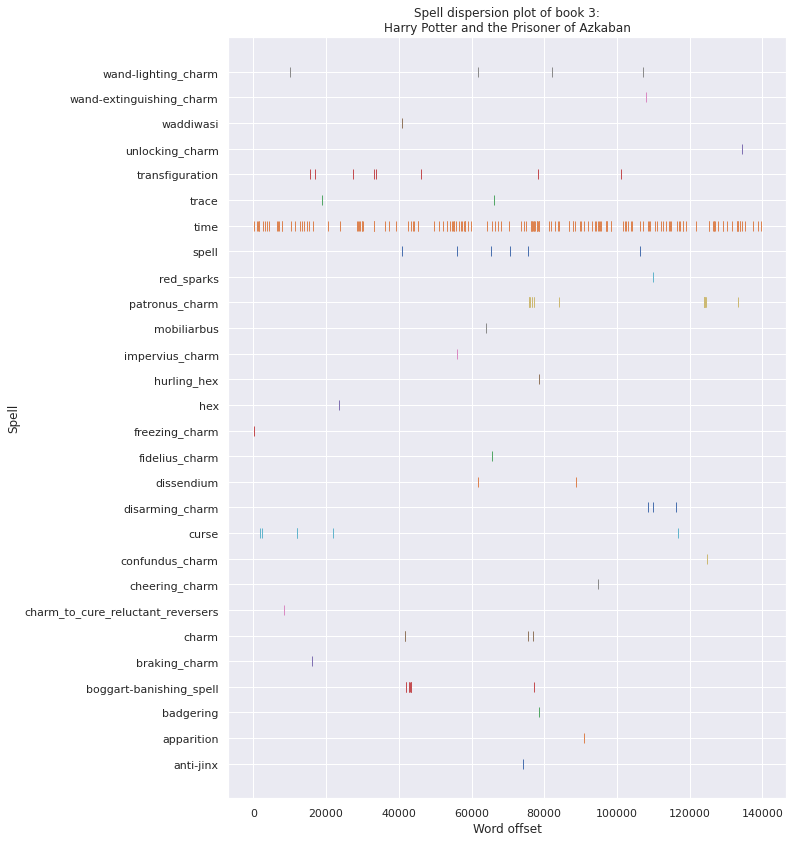

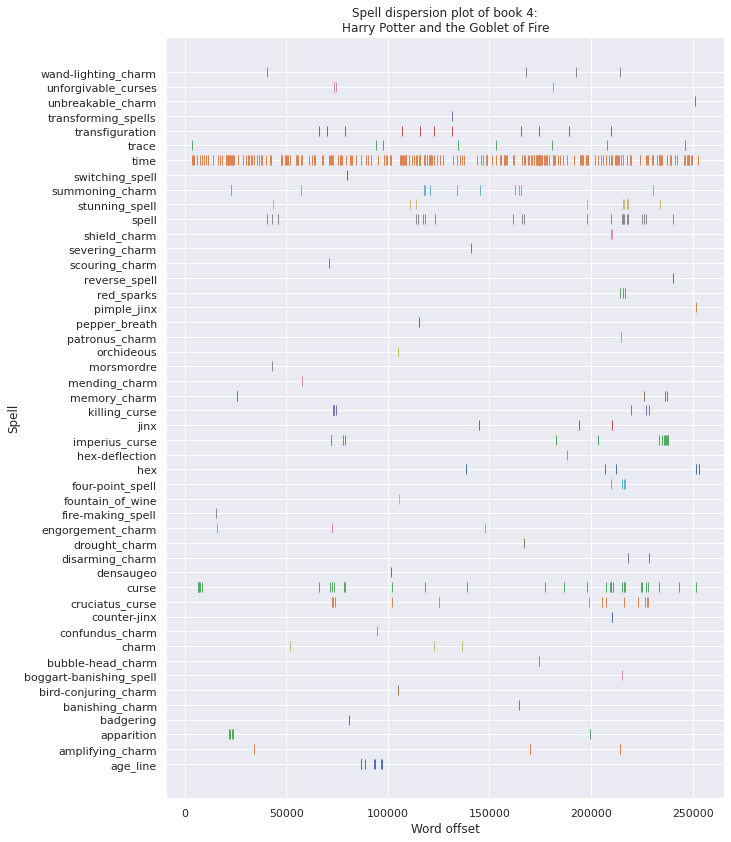

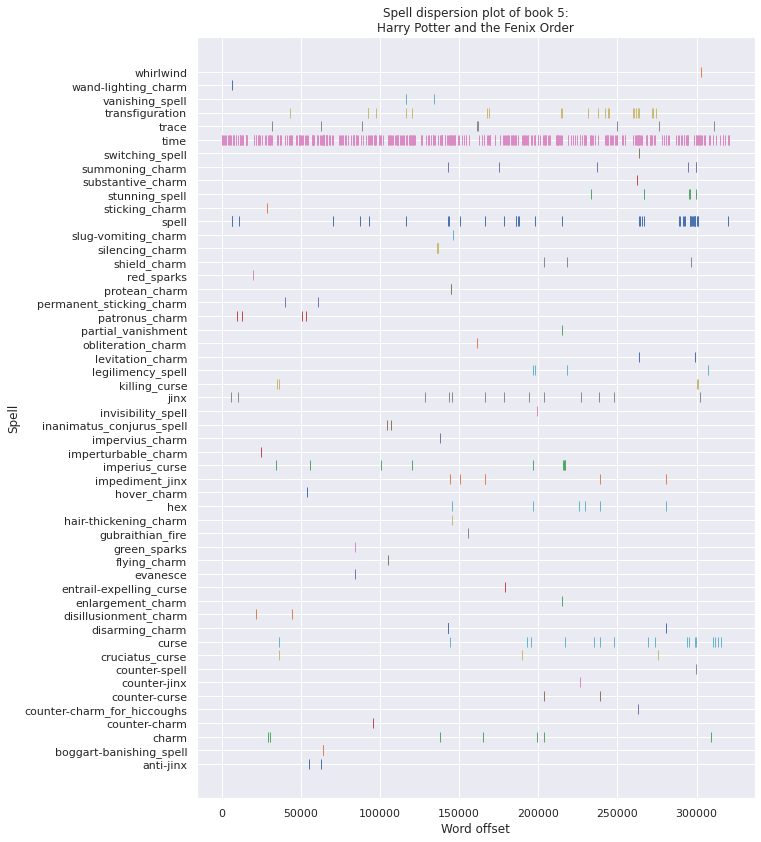

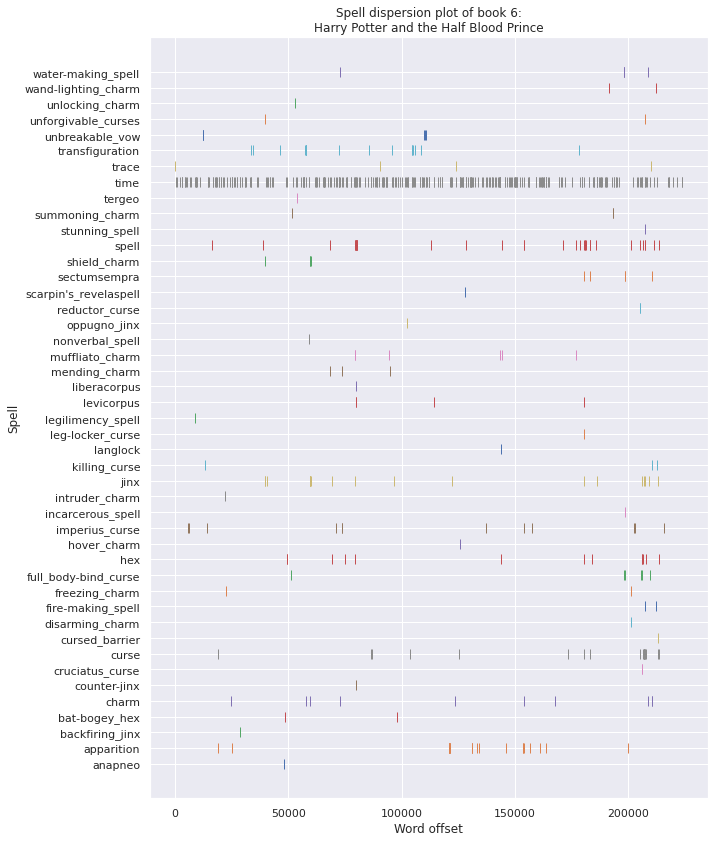

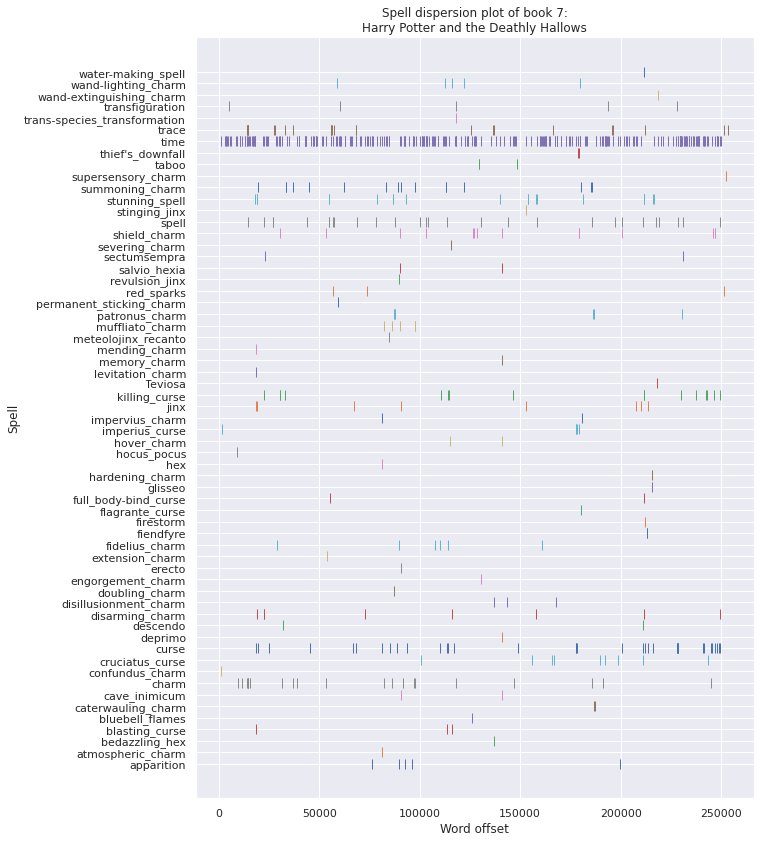

In [290]:
# Make dispersion plot
# Iterate through each book
spells_in_book = []
for i in range(len(books)):

    for(spell,occ_list) in spells_name:
        occ_list.clear()
    
    spells_in_book.clear()
    # Look through each word of the text
    # and look for house, if found add as a point
    # where y is house and x is word offset 
    for j, word in enumerate(word_tokenize(spells_book_text[i])):
        for(spell,occ_list) in spells_name:
            if word == spell:
                occ_list.append(j)
    
    for(spell,occ_list) in spells_name:
        if len(occ_list) > 0:
          spells_in_book.append((spell, occ_list))

    # Make plots 
    markerwidth = 1
    marker_size = 10

    plt.figure(figsize=(10,14))
    for (spell, occ_list) in spells_in_book:
        spell_y = [spell] * len(occ_list)
        spell_x = occ_list
        plt.plot(list(spell_x), list(spell_y), '|', markeredgewidth= markerwidth, markersize=marker_size)
    book_title = books[i]
    plt.title("Spell dispersion plot of book " + str(i+1) + ":\n" + book_title)
    plt.xlabel("Word offset")
    plt.ylabel("Spell")
    ax = plt.gca()
    #ax.set_facecolor('#f5f5f5')
    #ax.margins(y=0.3)
    fig = plt.gcf()
    #fig.tight_layout()
    plt.subplots_adjust(wspace=2, hspace=2)
    plt.savefig("SpellDispersionPlotsFull/dispersion_plot_book_" + str(i+1) + ".png", bbox_inches='tight')
    plt.show() 

One thing to note about these plots is that by far the most occuring spell is called "time". 
This is because in the Harry Potter universe time is listed as a spell and something that can be manipulated as in book 3. 
However, it is also used in the books as a regular word  quiet often used.
So most of the apperances of time is not related to it being used with a spell.
Other examples of this is the words "spell" and "charm" which are not necessarily said when using a spell, but could just be used in everday talk, which would not be too surprising. 
In the earlier books there are not a lot of spells being used. 
This is perhaps not surprising as Harry and his friends have justed started to learn magic and their knowledge og spells is thus quite limited. 
Though as the story progress through the books, more and more spells are being used. 
Especially from book 4 and forward a large amount of spells being used can be seen compared to the first three books. 
It is also not until the fourth book, where Lord Voldemort returns, that the use of the three [Unforgivable curses](https://harrypotter.fandom.com/wiki/Unforgivable_Curses) is observed:
 [The Killing curse](https://harrypotter.fandom.com/wiki/Killing_Curse), [The Cruciatus curse](https://harrypotter.fandom.com/wiki/Cruciatus_Curse) and 
 [The Imperius curse](https://harrypotter.fandom.com/wiki/Imperius_Curse). 
 For an avid Harry Potter reader it might also be possible to pinpoint either points in the story based on the usage of spells like the "memory_charm" in book 2 or 
 which books is being displayed by the usage of certain spells like the "age_line" in book 4.

### Movie Analysis

#### TF-IDF and wordclouds

The same idea as with the house and book TF-IDF and wordcloud creations are present for the movies.
Therefore, we will not go into that much of details in the following creation of wordclouds. 
However, creation of wordclouds for the movies were done to serve as a comparison to the books.
The group found it interesting to create wordclouds for both the movies and books
and see how much they differ and if the creators of the movies
did a good job of converting fairly long books into movies by bringing the most important storylines onto the big screen.

Firstly, the wordclouds are created based on the same method for TF-IDF:

In [291]:
wordcloud_strings_movie = dict()

N = len(movie_freq)

# Iterate through each book
for i in range(1,N+1):
    # Create wordcloud string for book
    wordcloud_strings_movie[i] = ""

    max_count = max(list(movie_freq[i].values()))

    # Go through each word and their frequency
    for (word, count) in list(movie_freq[i].items()):

            # Calc TF
            tf = (0.5 + 0.5 * (count / max_count))
            # Calc IDF
            nt = countInDict(word, movie_freq)
            idf = np.log(N/nt)

            # Calc TF-IDF
            tf_idf = tf * idf

            # Find count of words based on tf-idf as weight
            wc_count = round(count * tf_idf)
        
            # Add the word to the string based on count
            word_string = (word + " ") * wc_count
            wordcloud_strings_movie[i] += word_string


Strings for each movie have been created, and now the wordclouds are generated:

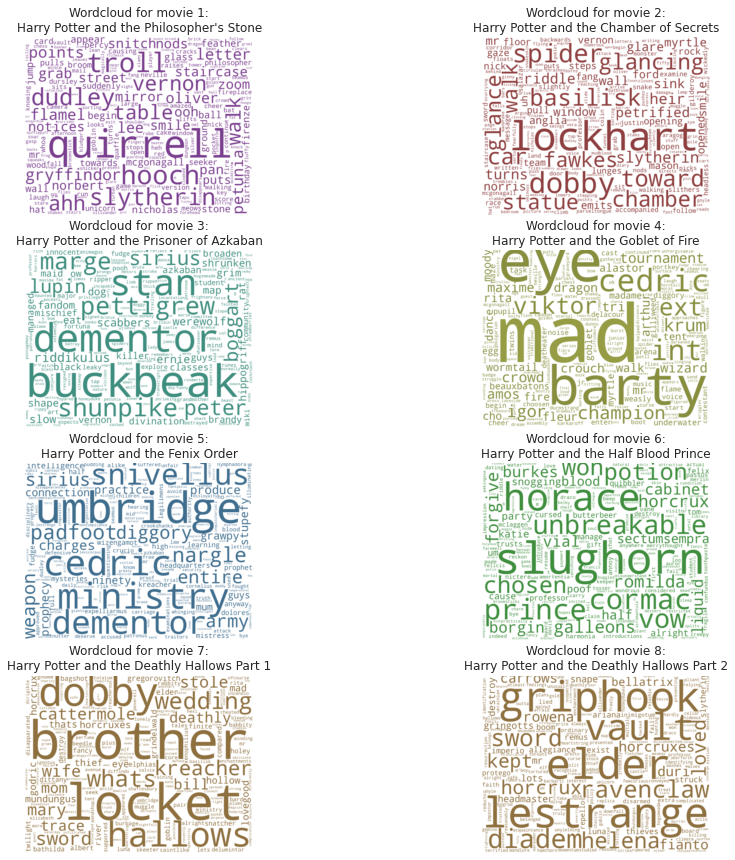

In [292]:
# Look-up for book titles
movies = ["Harry Potter and the Philosopher's Stone", "Harry Potter and the Chamber of Secrets", "Harry Potter and the Prisoner of Azkaban", "Harry Potter and the Goblet of Fire", "Harry Potter and the Fenix Order", "Harry Potter and the Half Blood Prince", "Harry Potter and the Deathly Hallows Part 1", "Harry Potter and the Deathly Hallows Part 2" ]

# Define plot axis
fig, axs = plt.subplots(4, 2,  figsize=(15, 15), sharey=True)

# Variables used for wordcloud color determination
max_font_size = 1400
color_picker = 0
hues = [285, 360, 169, 65, 205, 120, 37, 37]

# Wordcloud color function, changes luminance based on word count
# and hue based on book
def color_func(word, font_size, position,orientation,random_state=None, **kwargs):
    lum = 100 * (font_size / max_font_size)
    lum = max(lum, 40)
    lum = min(lum, 80)
    hue  = hues[color_picker]
    return "hsl(%d, 39%%, %d%%)" % (hue, lum)

# Iterate through all books and create a wordcloud for each
row = 0
for i in range(1,9):
    wc = WordCloud(
            stopwords= ['wa', "n't", 's', 'said', 'd', 'c'] + list(STOPWORDS),
            background_color='white',
            width=1800,
            height=1400,
            collocations = False,
            color_func = color_func
        ).generate(wordcloud_strings_movie[i])

    col = (i-1) % 2
    axs[row, col].imshow(wc, interpolation='bilinear')
    axs[row, col].axis("off")

    movie_title = movies[i-1]
    axs[row, col].set_title("Wordcloud for movie " + str(i) +":\n" + movie_title) 

    if i % 2 == 0:
        row += 1
    
    color_picker += 1

plt.savefig("movies_wc.png")
plt.show()

Like with the books, each individual wordcloud is also created:

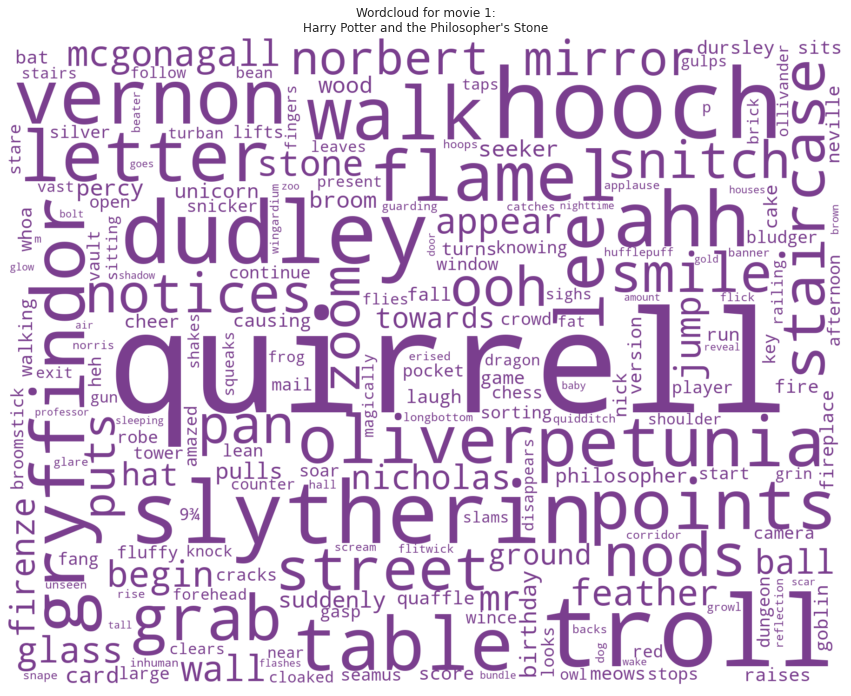

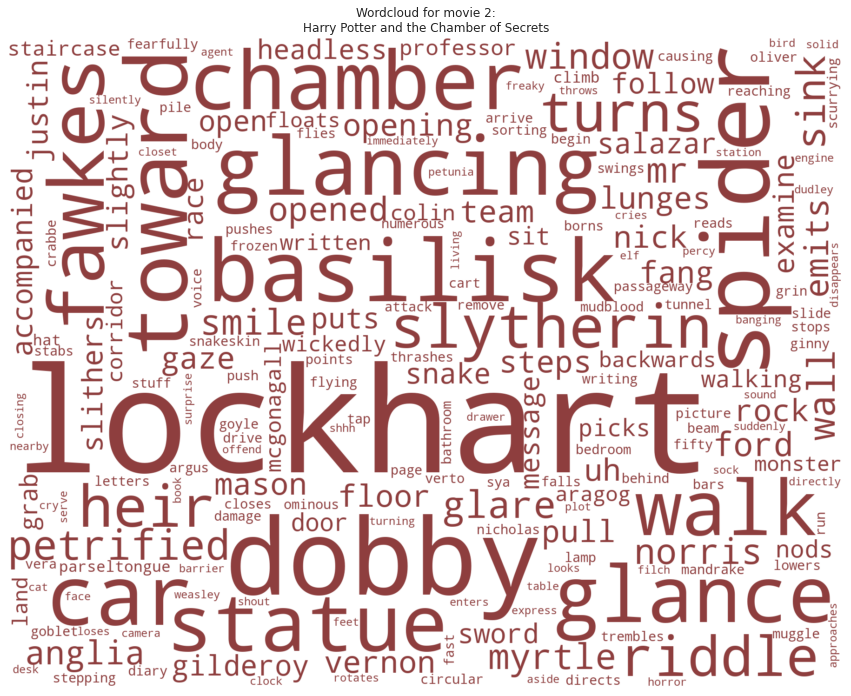

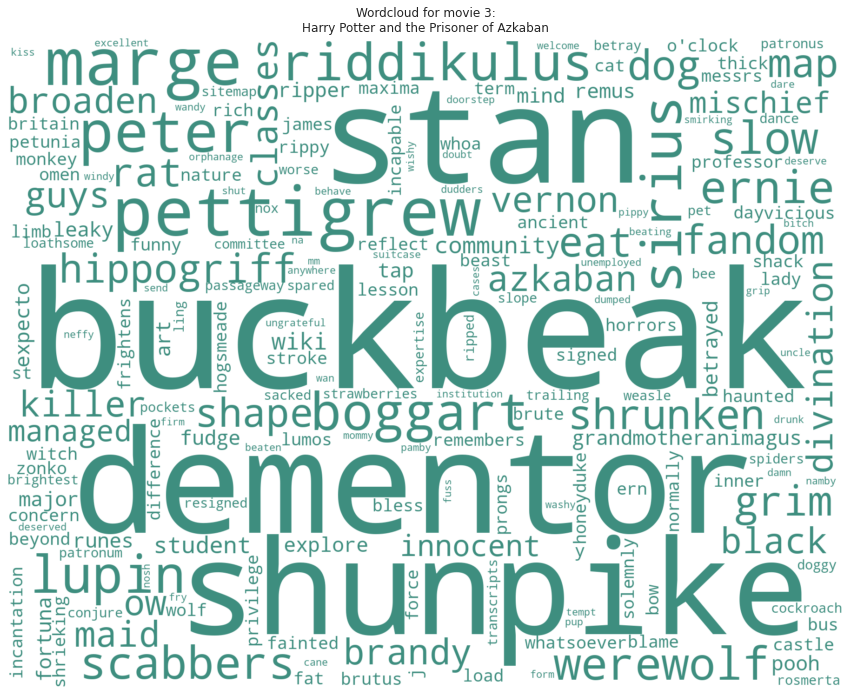

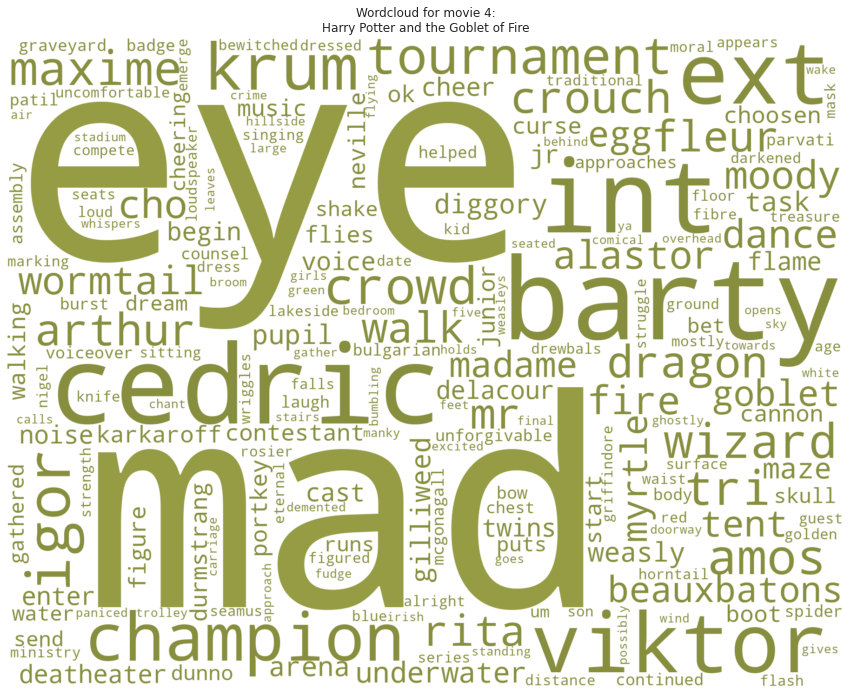

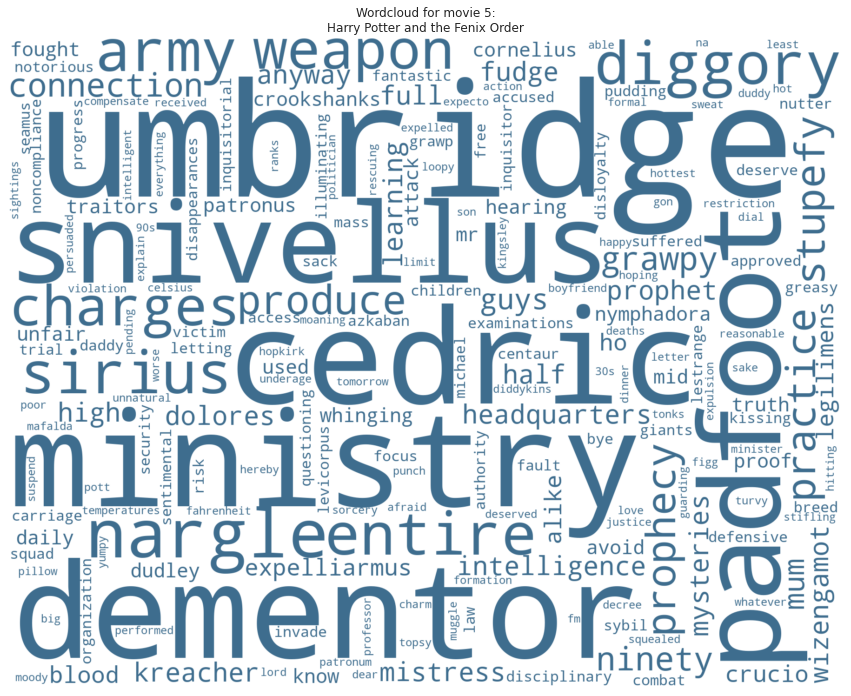

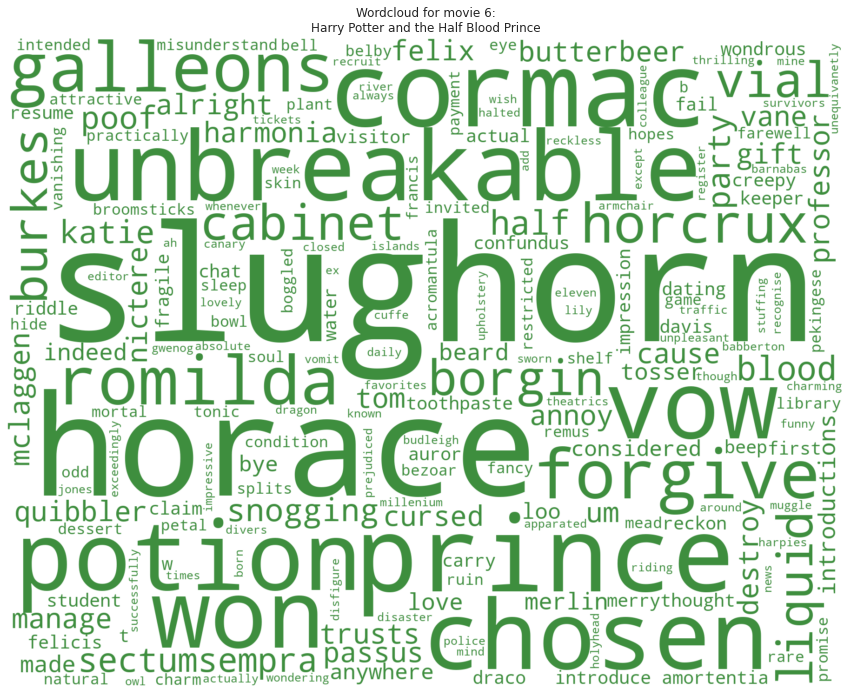

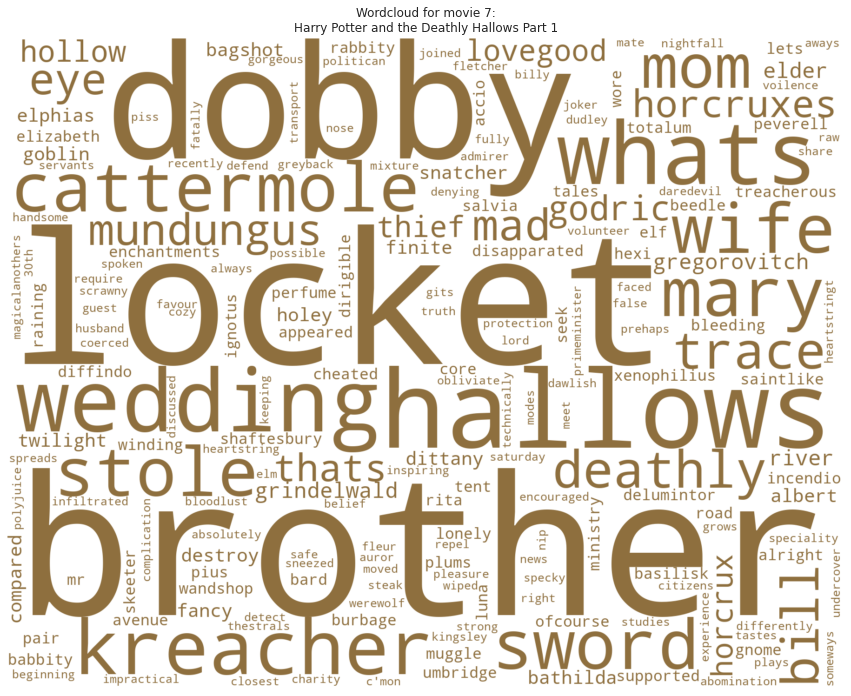

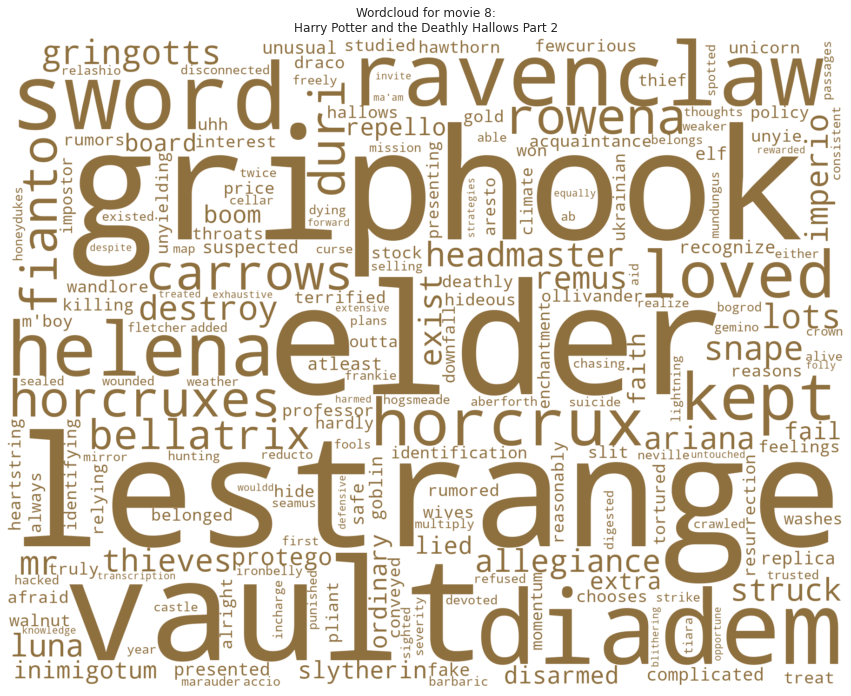

In [294]:
color_picker = 0
for i in range(1,9):
    plt.figure(figsize=(15,15))

    wc = WordCloud(
            stopwords= ['wa', "n't", 's', 'said', 'd', 'c'] + list(STOPWORDS),
            background_color='white',
            width=1800,
            height=1400,
            collocations = False,
            color_func = color_func
        ).generate(wordcloud_strings_movie[i])

    col = (i-1) % 2
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")

    movie_title = movies[i-1]
    plt.title("Wordcloud for movie " + str(i) +":\n" + movie_title) 

    color_picker += 1

    file_name_movie_wc = "MovieWCPlots/movie_wc_" + str(i) + ".png"
    plt.savefig(file_name_movie_wc)

As with the book wordclouds, each movie are well-described based on each wordcloud. 
However, it is interesting to see some changes in what is most important when comparing the books with the movies. 
It makes sense that a movie cannot have all plot points of the corresponding book and needs to focus on some plot points. 
An example is Buckbeak - Hagrid's hippogriff.
Buckbeak is a major plot point in the movies, but seems to blend more in with other plot points in the books. 
Another thing one notices is that somethings from the books are completely omitted in the movies. 
An example is in the fourth book and movie "Harry Potter and the Goblet of Fire". 
The book contains a character called Ludovic Bagman, who in the books is the Head of the Department of Magical Games and Sports. 
He is therefore very prominent in the books during the Tri-wizard tournament. 
However, he is not in the movies which is reflected in the wordcloud.
But the general thing to take away from the movie wordclouds compared to the books is that the writers of the movies certainly have done a good job in getting the most important story-lines into the movies.
In most cases many of the words from the books are the same as the movies. 


#### Spell dispersion plot

The same spell dispersion plots that was created for the books will be done for the movies. Here the procedure is the same so it will not be explained in depth.

Since all the spells have already been gathered the process of substituting the incantations with the name of the spells and spells with their transformed names can be begun.

In [295]:
# Go through each movie
spells_movie_text = dict()
# Look-up for movie titles
movies = ["Harry Potter and the Philosopher's Stone", "Harry Potter and the Chamber of Secrets", "Harry Potter and the Prisoner of Azkaban", "Harry Potter and the Goblet of Fire", "Harry Potter and the Fenix Order", "Harry Potter and the Half Blood Prince", "Harry Potter and the Deathly Hallows Part 1", "Harry Potter and the Deathly Hallows Part 2" ]

for i in range(len(movies)):
    # Get movie text
    movie_text = open("Movie_text_files/movie" + str(i+1) + ".txt", "r")
    
    # Set text to movie text
    spells_movie_text[i] = movie_text.read().lower()

    # Go through each spell and incantation pair
    for (s,inc) in spells_name_and_incantation:

        # Find incantation in text and replace with spell
        spell = s
        incantation = inc
        spells_movie_text[i] = re.sub(r"{}".format(inc), spell, spells_movie_text[i])


    for s in spells_name_temp:
        spells_movie_text[i] = re.sub(r"{}".format(s), s.replace(" ", "_"), spells_movie_text[i])


Now it is simply a matter of looping through each movie text file and then create the plots.

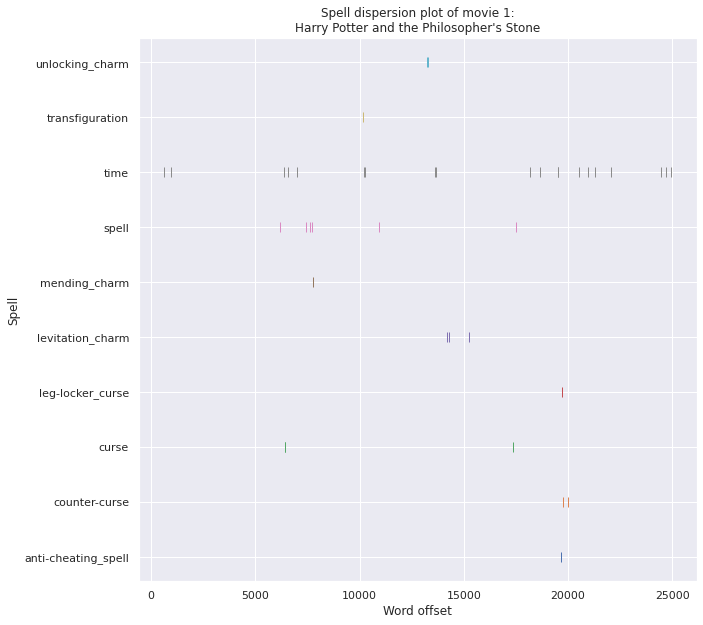

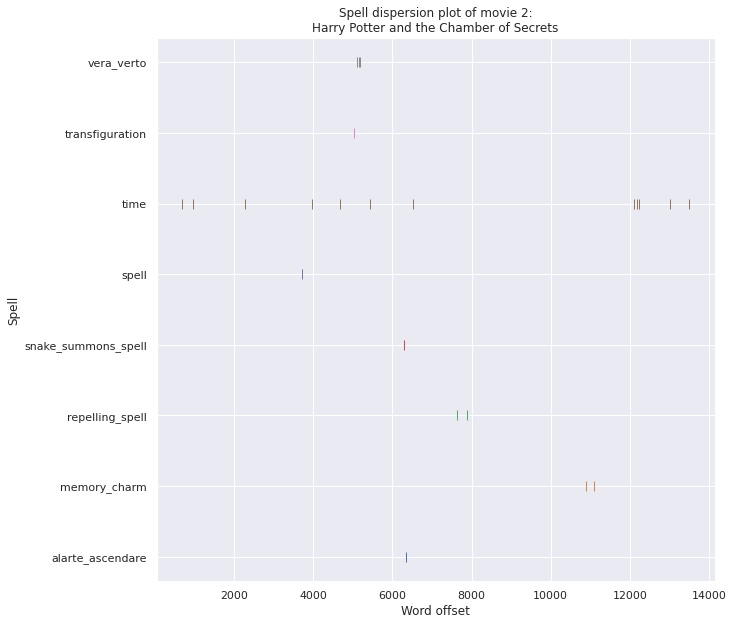

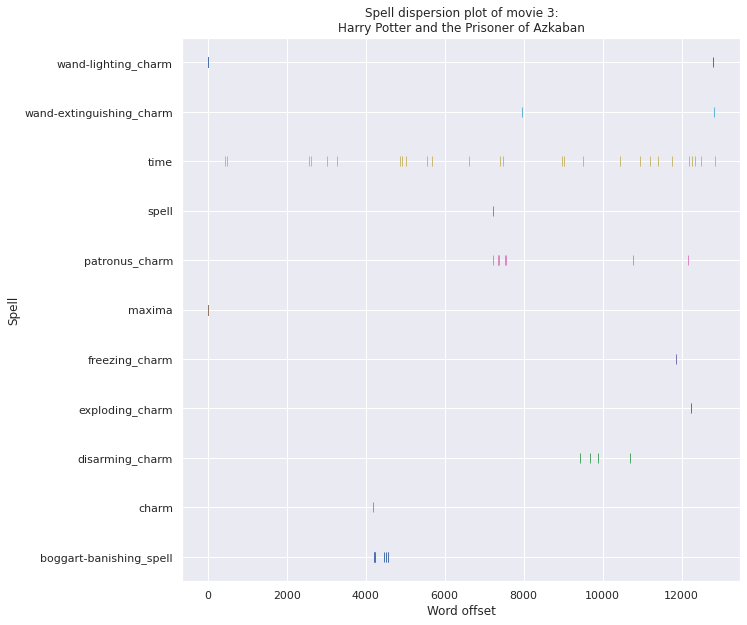

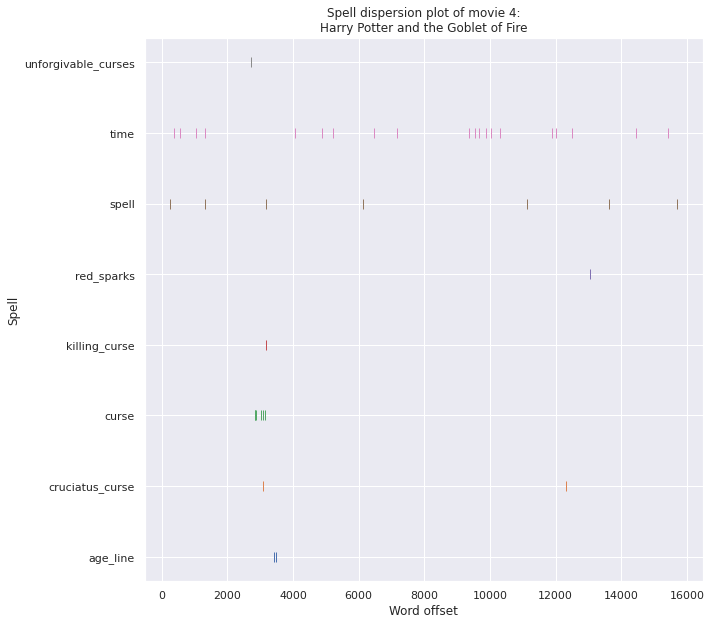

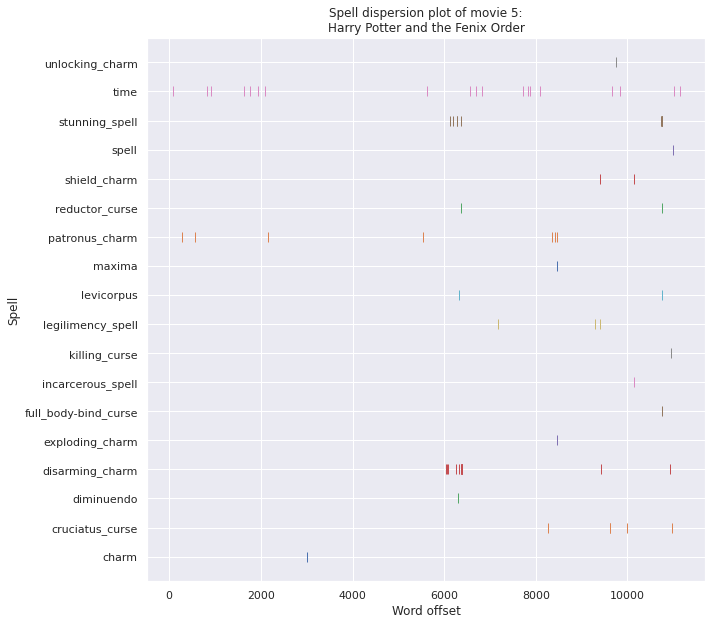

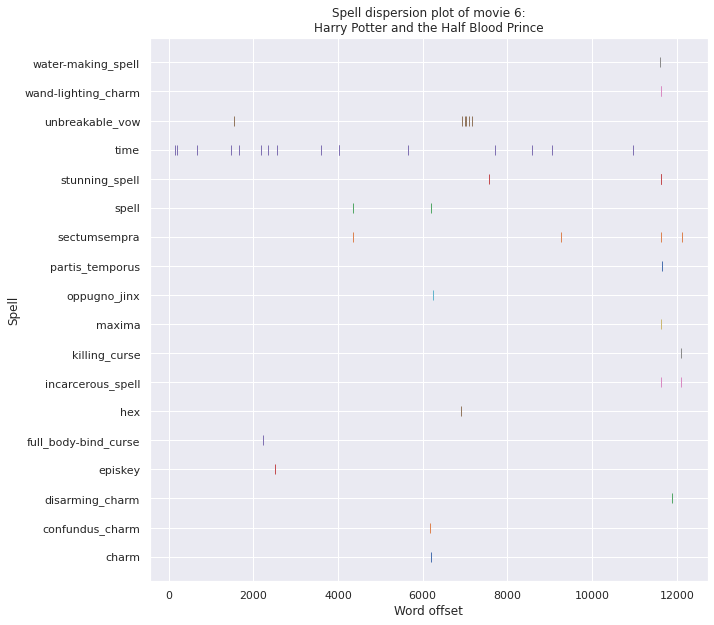

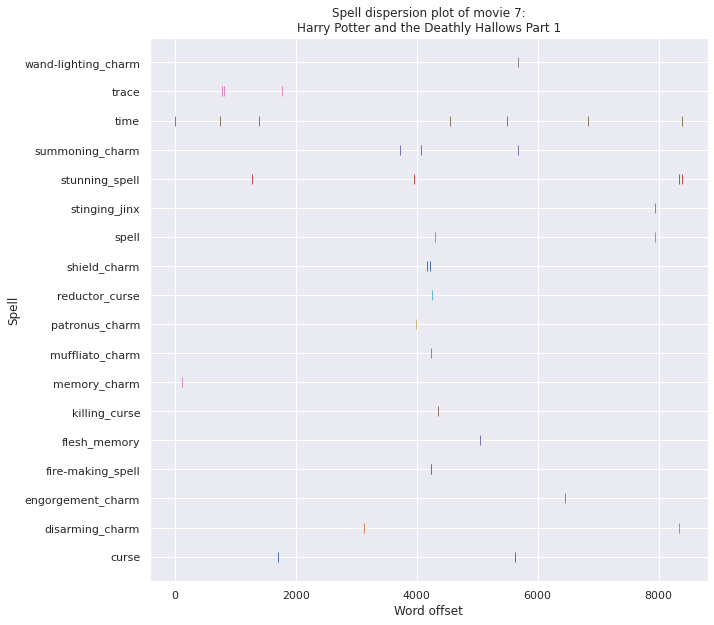

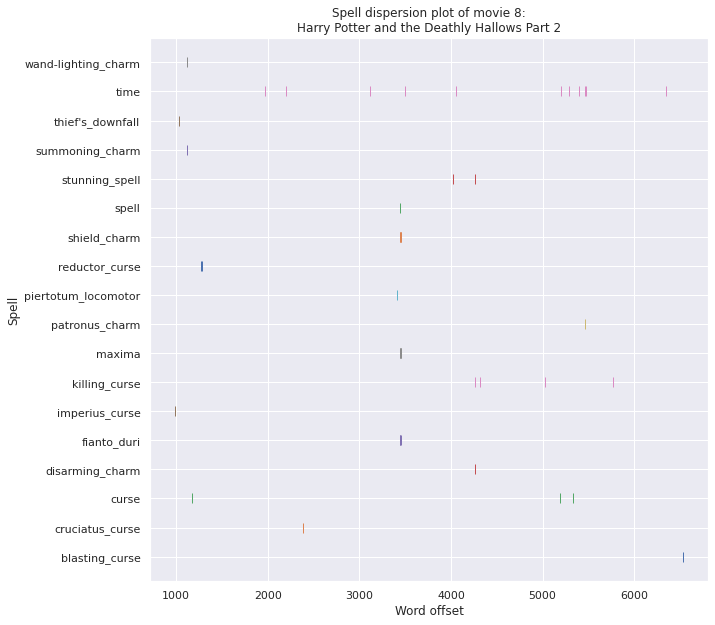

In [296]:
# Make dispersion plot
# Iterate through each movie
spells_in_movie = []
for i in range(len(movies)):

    for(spell,occ_list) in spells_name:
        occ_list.clear()
    
    spells_in_movie.clear()
    # Look through each word of the text
    # and look for house, if found add as a point
    # where y is house and x is word offset 
    for j, word in enumerate(word_tokenize(spells_movie_text[i])):
        for(spell,occ_list) in spells_name:
            if word == spell:
                occ_list.append(j)
    
    for(spell,occ_list) in spells_name:
        if len(occ_list) > 0:
          spells_in_movie.append((spell, occ_list))

    # Make plots 
    markerwidth = 1
    marker_size = 10

    plt.figure(figsize=(10,10))
    for (spell, occ_list) in spells_in_movie:
        spell_y = [spell] * len(occ_list)
        spell_x = occ_list
        plt.plot(list(spell_x), list(spell_y), '|', markeredgewidth= markerwidth, markersize=marker_size)
    movie_title = movies[i]
    plt.title("Spell dispersion plot of movie " + str(i+1) + ":\n" + movie_title)
    plt.xlabel("Word offset")
    plt.ylabel("Spell")
    ax = plt.gca()
    #ax.set_facecolor('#f5f5f5')
    #ax.margins(y=0.3)
    fig = plt.gcf()
    #fig.tight_layout()
    plt.subplots_adjust(wspace=2, hspace=2)
    plt.savefig("SpellDispersionPlotsFull/dispersion_plot_movie_" + str(i+1) + ".png", bbox_inches='tight')
    plt.show() 

In the movies, the same pattern as in the books is seen: in the first couple of years the usage of spells are toned down a bit and then later on they start to appear more and more. 
The usage of spells is however not as large as in the books and there is also used a lot less distinct spells in the movies. 
This might be explained due to the movies haveing to cut out some parts of the plot compared to the books. 
The occurances of words such as "time", "curse", "spell" and "charm" are quiet a bit lower in the movies compared to the books.

## Discussion

In general, the group thinks that many interesting ideas were covered in this project. Many of the things learned during the course 02805 were used to compute great results.
The scope of this project was mainly focused on houses at Hogwarts. But the Harry Potter universe consists of many other characters; muggles, creatures and wizards of other schools. 
It would therefore be interesting to expand upon what have been done and include the whole Wizarding World of Harry Potter.
For many of the methods used, there were an issue where the methods could not distinguish normal usages of words with specific word types. 
Examples include spells that got mistaken with normal words (e.g. time) and names that got miss-categorized as adjectives. A way to handle this would certainly improve our results.
The usage of the unknown house could perhaps also have been more thorough. Even though many of the found characters were in this unknown house, the focus was on the four Hogwarts houses.
It could have been interesting to see who the characters in the unknown house were and why preciscly they are placed in this house. 
The community detection could certainly also be expanded upon by finding answers to why the communities where as they were. 
However, due to time constraints and scoping this issue was not examined further.
Finally, it was assumed for character collection that names where unique and alternative links for characters were not considered.
Certainly all the important characters has been found. 
However, it could be the case that some very minor characters were missed in this process.

No members in the group had previous experience in creating a webpage. 
It was therefore a learning process to actually create a visually pleasing website. 
Even though it was a bit difficult in the beginning, it became easier later on during the project and we think the outcome is great considering the circumstances. 
All created visualiations are in fact static. 
However, the group tried to add some interactive elements like slideshows and toggles to enchance the viewing experience. 
These are great additions for helping the viewer understand and learn about the different elements we want to show. 
Our limited knowledge of creating webpages was however an obstacle for the amount of interactability shown on the page.
If this project was carried out further, it would be nice to have some sort of actual dynamic elements. 
An example could be visulization of the network where one could click on nodes and get information about that particular node or filter out parts of the network.  

## Contributions

In general, the aim was for the group members to contribute equally.
However, to ensure that important aspects of the project was carried out,
main responsibilities were distributed between the group members:

| Subject        | Group Member   
| ------------- |:-------------:| 
| Setup of website      | Rasmus | 
| Collection of fandom pages      | Frederik      |   
| Collection of books and movies | Rasmus     |   
| Creation of network and basic stats | Frederik      |   
| Connectivity between houses | Selma      |   
| Community Detection | Selma      |  
| Text analysis for books and movies (sentiment change, wordclouds, house representation) | Rasmus      |   
| Text analysis for houses (sentiment, wordclouds) | Selma      |   
| Spell usage change for books and movies | Frederik      |   